## THE NETWORK OF VOLTAIRE'S PHILOSOPHICAL DICTIONARY 
## Notebook 4: Graphs of co-occurrent dictionary terms and names
## By M.A. Boudourides, H. Bin Fahad, Y. Malla, & S. Silwal

In [46]:
import codecs,re, math, random, pickle, operator, string,urllib2, pandas as pd,numpy as np,itertools as it
from collections import Counter

import nltk
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.tag import pos_tag
from textblob import TextBlob

import networkx as nx
from networkx import NetworkXNoPath
from networkx.algorithms import bipartite
from networkx.drawing.nx_agraph import graphviz_layout
import pygraphviz
import matplotlib.pyplot as plt
import matplotlib as mpl
from wordcloud import WordCloud

import community

# Change the following two lines:
# import os
# os.chdir("/Users/[User Name]/Desktop/")

import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=RuntimeWarning) 

In [47]:
filename = 'Voltaire_PhilosophicalDictionary_mod1.txt' # Insert in quotes the name of your txt file, e.g. "PeterPan.txt"
titlename = "Voltaire's Philosophical Dictionary"   # Insert in quotes the name of the novel (or book), e.g., "Peter Pan"

f = codecs.open(filename, "r", encoding="utf-8").readlines()

num_lines = 0
num_words = 0
num_chars = 0
for line in f:
    words = line.split()
    num_lines += 1
    num_words += len(words)
    num_chars += len(line)
print "%s has number of words = %i (and number of characters/symbols = %i)" %(titlename,num_words,num_chars)

Voltaire's Philosophical Dictionary has number of words = 88628 (and number of characters/symbols = 515505)


In [3]:
stext="\n".join(f).split("##########################################################")
print len(stext)
# stext[6]

docsd={}
for i in range(len(stext)):
    sb=stext[i].split("\r\n\n\r\n\n")
    se=[w.replace("\r\n\n"," ") for w in sb[1:]]
    se=", ".join(se).strip()
    docsd[sb[0].strip()] = se
# for k,v in docsd.items():
#     print k,v
#     print
docs=docsd.values()
len(docs)

99


99

In [4]:
text=", ".join(f).encode('ascii','ignore').replace('\n',' ')
print len(text) #, type(text)
# text

535765


In [5]:
with open('names.pickle', 'rb') as handle:
    c = pickle.load(handle)
with open('terms.pkl', 'rb') as f:
     terms = pickle.load(f)
for term in terms:
    c[term]=3

In [6]:
pnames=[k for k,v in c.items() if v==1]
lnames=[k for k,v in c.items() if v==2]
nterms=[k for k,v in c.items() if v==3]
print len(pnames), len(lnames),len(nterms)
allnames=pnames+lnames+nterms
print len(allnames)

357 240 99
696


In [7]:
# for i in sorted(pnames):
#     print i

In [8]:
rem=["Chu","Eve","Charles","John","AmyotSt. Andre","FloraFontenelle",
    "AntonyPierre AoudriKing Aout","Louis XIVLouis XII","AphroditeApis",
    "Leo X.Leontius","Ardassan OugliArgonauts","Michael AngeloAnitus","Lemnos"]
add=["Chu ","Eve,","Charles I.","Charles II.","Charles V.","Charles VII.",
    "Charles VIII.","Charles IX.","Charles XII.","Amyot","St. Andre",
    "Flora","Fontenelle","Antony","Pierre Aoudri","King Aout","Louis XIV",
     "Louis XII","Aphrodite","Apis","Leo X.","Leontius","Ardassan Ougli",
     "Argonauts","Anitus","Michael Angelo"]
pnames=[w for w in pnames if w not in rem]
pnames=pnames+add
for i in sorted(pnames):
    print i

Abbe Charier
Abbe Houtteville
Abbe Pluche
Abbe Yvon
Abbe de Pons
Abelard
Abraham
Absyrthe
Achilles
Adam
Addison
Adimo
Admiral Coligny
Adonis
Aga of the Janissaries
Agamemnon
Agathon
Agricola
Ahriman
Albrecht Durer
Alcibiades
Alexander
Alexander the Great
Alsacian
Amarilli
Amasa
Ammonius
Amnon
Amyntas
Amyot
Anitus
Aniximanders
Antonine
Antoninus
Antony
Apelles
Aphrodite
Apis
Apollo
Arachne
Aragon
Arcadius
Archangel Gabriel
Archangel Raphael
Archbishop of Canterbury
Archbishop of Paris
Archimedes
Ardassan Ougli
Argonauts
Ariosto
Aristophanes
Aristotle
Arnauld
Arnobius
Arnoult
Arundel
Atticus
Attila
Augustus
Auriol
Azem
Bacchus
Balaam
Bambabef
Barneveldt
Bayle
Beaupere
Berriat Saint-Prix
Beuchot
Bishop Williams
Bishop of Beauvais
Bishop of Gloucester
Bishop of London
Bishop of Noyon
Bishop of Rome
Boerhaave
Boileau
Bolingbroke
Cacodemons
Caesar
Calas
Cambyses
Camillus
Cardinal Azolin
Cardinal Bembo
Cartouche
Catalina
Cataline
Catherine
Catilina
Cato
Cecrops
Cenaeus
Ceres
Cethegus
Chamilla

In [9]:
reml=["DouroLorraine","North Norway"]
addl=["Lemnos","Douro","Lorraine","Norway"]
lnames=[w for w in lnames if w not in reml]
lnames=lnames+addl
for i in sorted(lnames):
    print i

Abyssinia
Adriatic Gulf
Aea
Africa
Alba
Alexandria
Alps
America
Amsterdam
Apennines
Arabia
Araxes
Arbela
Arcira
Armenia
Arras
Asia
Athens
Austria
Babylon
Baltic Sea
Barbados
Barois
Basle
Batavia
Beaufort
Beaulieu
Beaurevoir
Bedford
Bedlam
Belgrade
Benares
Benevento
Bergamo
Bergerac
Birma
Blois
Boulevart
Bourges
Burgundy
Caesarea
Candia
Canterbury
Capitol
Castel-Gandolfo
Castello St. Angelo
Castille
Catalonia
Chaldea
Chantilli
China
Climart
Cobonas
Cochin
Coimbre
Colchis
Cologne
Compiegne
Compostella
Comte de Dunois
Comte de Ligny
Comte de Vermandois
Constantinople
Copenhagen
Coromandel
Crimea
Crotoy
Danube
Delhi
Denmark
Dodona
Douro
Dunkirk
Dunois
Dwina
Earth
Ebro
Edinburgh
Egypt
Elamites
Eleusis
Engadine valley
England
Ethiopia
Euphrates
Europe
Flanders
Fleetwood
France
Galatia
Ganges
Germany
Gibraltar
Glacial Sea
Greece
Guadalquivir
Guadiana
Guienne
Guinea
Hague
Havana
Holland
Hotel-de-Ville
Hull
Illyria
India
Indies
Indus
Ireland
Italy
Japan
Jerusalem
Juba
Jupiter
Jutland
Lacedaemon

In [10]:
# nterms=[w.strip() for w in nterms]

In [11]:
freq1=[]
for k in pnames:
    s=0
    for kk,v in docsd.items():
#         v=v.lower()
        s+=v.count(k)
    freq1.append(s)
trf1_df = pd.DataFrame(
    {'Character Name': pnames,
     'Frequency of Occurrences': freq1
    })
trf1_df=trf1_df[['Character Name','Frequency of Occurrences']]
trf1_df=trf1_df.sort_values(by ='Frequency of Occurrences',ascending=False)
trf1_df

,Character Name,Frequency of Occurrences
360,Louis XIV,26
229,Zarathustra,23
2,Caesar,22
89,Cromwell,22
307,Bayle,21
106,Newton,17
61,Dondindac,17
48,Logomacos,17
38,Mohammed,17
47,Joan,16


In [12]:
# x = [tuple(i) for i in trf1_df.values]
# for y in x:
#     print y[0],y[1]

In [13]:
# x = [tuple(i) for i in trf1_df.values]
# t=[]
# for (i,j) in x:
#     for k in range(j):
# #         print i.replace(" ","_").replace("-","_")
#         t.append(i.replace(" ","_").replace("-","_"))
# for i in sorted(set(t)):
#     print i

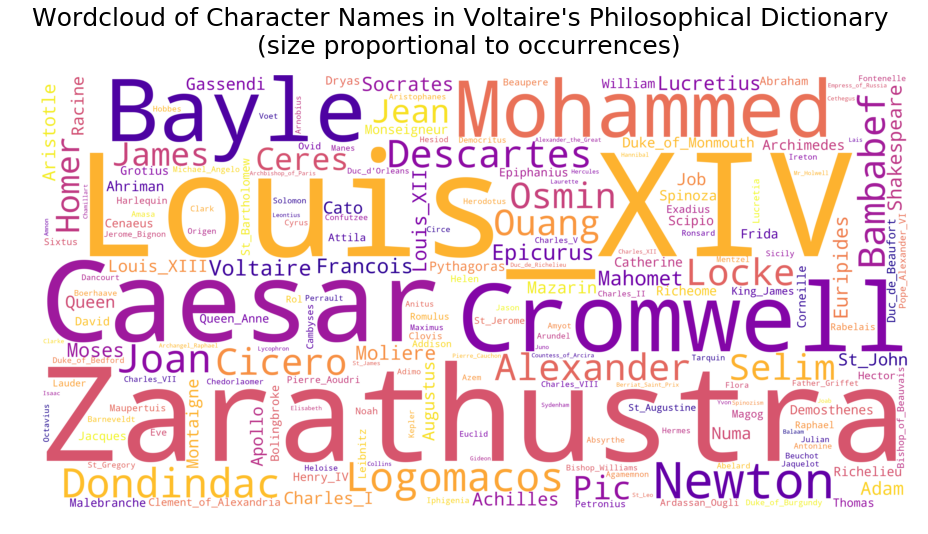

In [14]:
x = [tuple(i) for i in trf1_df.values]
t=[]
for (i,j) in x:
    for k in range(j):
#         print i.replace(" ","_").replace("-","_")
        t.append(i.replace(" ","_").replace("-","_").replace(".",""))
ttd=' '.join(t)
wordcloud = WordCloud(collocations=False,background_color="white",colormap="plasma",width=4000,height=2000).generate(ttd)
fig = plt.figure(figsize=(13,13))
default_colors = wordcloud.to_array()
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
ss="Wordcloud of Character Names in Voltaire's Philosophical Dictionary \n (size proportional to occurrences)"
plt.suptitle(ss,fontsize=25)
plt.tight_layout(rect=[0, 0, 1, 1.35]) 
plt.show()

In [15]:
freq2=[]
for k in lnames:
    s=0
    for kk,v in docsd.items():
#         v=v.lower()
        s+=v.count(k)
    freq2.append(s)
trf2_df = pd.DataFrame(
    {'Location Name': lnames,
     'Frequency of Occurrences': freq2
    })
trf2_df=trf2_df[['Location Name','Frequency of Occurrences']]
trf2_df=trf2_df.sort_values(by ='Frequency of Occurrences',ascending=False)
trf2_df

,Location Name,Frequency of Occurrences
121,France,45
52,India,39
24,Europe,34
95,Egypt,32
166,Rome,31
179,England,30
101,Paris,20
69,Asia,19
58,Jupiter,19
57,China,16


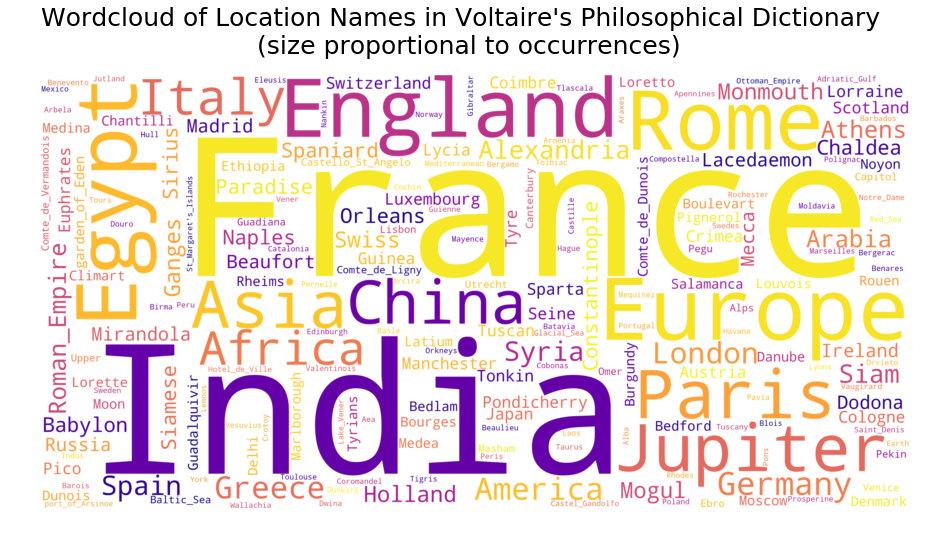

In [16]:
x = [tuple(i) for i in trf2_df.values]
t=[]
for (i,j) in x:
    for k in range(j):
#         print i.replace(" ","_").replace("-","_")
        t.append(i.replace(" ","_").replace("-","_").replace(".",""))
ttd=' '.join(t)
wordcloud = WordCloud(collocations=False,background_color="white",colormap="plasma",width=4000,height=2000).generate(ttd)
fig = plt.figure(figsize=(13,13))
default_colors = wordcloud.to_array()
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
ss="Wordcloud of Location Names in Voltaire's Philosophical Dictionary \n (size proportional to occurrences)"
plt.suptitle(ss,fontsize=25)
plt.tight_layout(rect=[0, 0, 1, 1.35]) 
plt.show()

In [17]:
freq3=[]
for k in nterms:
    s=0
    for kk,v in docsd.items():
        v=v.lower()
        s+=v.count(k)
        s+=kk.count(k)
    freq3.append(s)
trf3_df = pd.DataFrame(
    {'Term': nterms,
     'Frequency of Occurrences': freq3
    })
trf3_df=trf3_df[['Term','Frequency of Occurrences']]
trf3_df=trf3_df.sort_values(by ='Frequency of Occurrences',ascending=False)
trf3_df

,Term,Frequency of Occurrences
39,art,360
30,god,225
57,nature,151
14,soul,150
37,reason,133
21,law,132
50,why,105
17,necessary,93
82,power,91
94,book,91


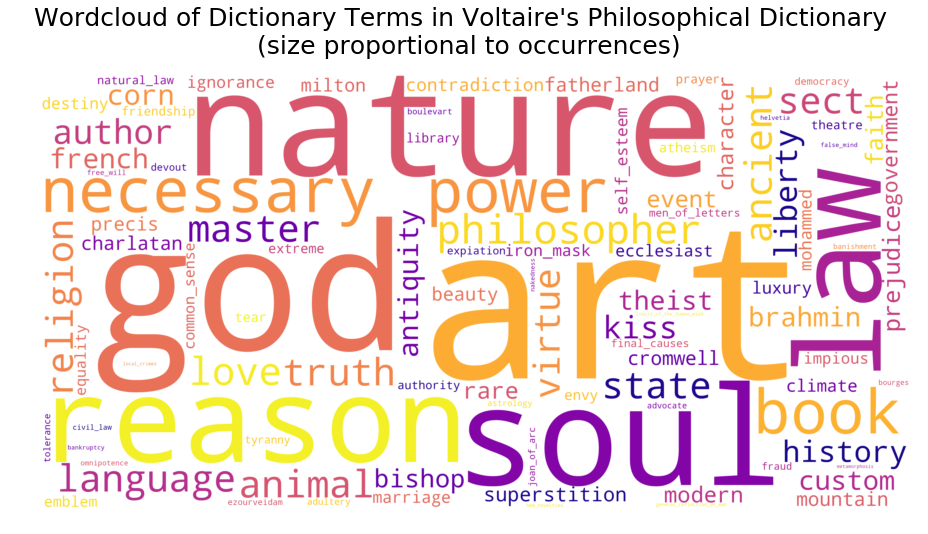

In [18]:
x = [tuple(i) for i in trf3_df.values]
t=[]
for (i,j) in x:
    for k in range(j):
#         print i.replace(" ","_").replace("-","_")
        t.append(i.replace(" ","_").replace("-","_").replace(".",""))
ttd=' '.join(t)
wordcloud = WordCloud(collocations=False,background_color="white",colormap="plasma",width=4000,height=2000).generate(ttd)
fig = plt.figure(figsize=(13,13))
default_colors = wordcloud.to_array()
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
ss="Wordcloud of Dictionary Terms in Voltaire's Philosophical Dictionary \n (size proportional to occurrences)"
plt.suptitle(ss,fontsize=25)
plt.tight_layout(rect=[0, 0, 1, 1.35]) 
plt.show()

In [19]:
allnames=pnames+lnames+nterms
print len(pnames),len(lnames),len(nterms)
len(allnames)

370 242 99


711

## 1. The Graph of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations in Dictionary Items

In [20]:
# medges=[]
# for k,v in docsd.items():
#     for j in it.combinations(allnames, 2):
#         if j[0] in v and j[1] in v:
#             medges.append((j[0],j[1],k))
# print len(medges),len(set(medges))
# medges

In [21]:
# with open('medges.pkl', 'wb') as f:
#     pickle.dump(medges, f)
with open('medges.pkl', 'rb') as f:
    medges = pickle.load(f)
print len(medges),len(set(medges))
medges

39269 39269


[('Collins', 'Clark', u'liberty'),
 ('Collins', 'Locke', u'liberty'),
 ('Collins', 'Mazarin', u'liberty'),
 ('Collins', 'France', u'liberty'),
 ('Collins', 'London', u'liberty'),
 ('Collins', 'love', u'liberty'),
 ('Collins', 'soul', u'liberty'),
 ('Collins', 'reason', u'liberty'),
 ('Collins', 'liberty', u'liberty'),
 ('Collins', 'state', u'liberty'),
 ('Collins', 'philosopher', u'liberty'),
 ('Collins', 'power', u'liberty'),
 ('Collins', 'book', u'liberty'),
 ('Clark', 'Locke', u'liberty'),
 ('Clark', 'Mazarin', u'liberty'),
 ('Clark', 'France', u'liberty'),
 ('Clark', 'London', u'liberty'),
 ('Clark', 'love', u'liberty'),
 ('Clark', 'soul', u'liberty'),
 ('Clark', 'reason', u'liberty'),
 ('Clark', 'liberty', u'liberty'),
 ('Clark', 'state', u'liberty'),
 ('Clark', 'philosopher', u'liberty'),
 ('Clark', 'power', u'liberty'),
 ('Clark', 'book', u'liberty'),
 ('Locke', 'Mazarin', u'liberty'),
 ('Locke', 'France', u'liberty'),
 ('Locke', 'London', u'liberty'),
 ('Locke', 'love', u'liber

In [22]:
G = nx.MultiGraph()
G.add_edges_from(medges)
weight={(x,y):v for (x, y), v in Counter(G.edges()).items()}
w_edges=[(x,y,z) for (x,y),z in weight.items()]
Gw = nx.Graph()
Gw.add_weighted_edges_from(w_edges)
# Gw.remove_node("cours")
print len(Gw.nodes()), len(Gw.edges())

# nodeterms=[n for n in Gw.nodes() if n in nterms]
# nodenames=[n for n in Gw.nodes() if n in pnames]
# nodelocs=[n for n in Gw.nodes() if n in lnames]

nodeterms=[n for n in Gw.nodes() if n in nterms]
nodenames=[n for n in Gw.nodes() if n in pnames]
nodelocs=[n for n in Gw.nodes() if n in lnames]
print "The nodes of Gw are:"
print len(nodeterms),"terms"
print len(nodenames),"names"
print len(nodelocs),"locations"

print "The density of Gw is %.3f" %nx.density(Gw)
if nx.is_connected(Gw)==True:
    print "Gw is a connected graph"
else:
    print "Gw is a disconnected graph and it has",nx.number_connected_components(Gw),"connected components"    

# giant = max(nx.connected_component_subgraphs(Gw), key=len)
# Gwl=Gw.subgraph(giant)
# print "The largest connected component of Gw is a weighted graph with %i nodes and %i edges" %(len(Gwl.nodes()),len(Gwl.edges()))
# print "The density of the largest connected component of Gw is %.3f" %nx.density(Gwl)

# # lccmedges=[]
# # for e in medges:
# #     if e[0] in giant and e[1] in giant:
# #         lccmedges.append((e[0],e[1]))
# # NN=len(Gwlcc.nodes())
# # SS=len(lccmedges)

696 25561
The nodes of Gw are:
84 terms
370 names
242 locations
The density of Gw is 0.106
Gw is a connected graph


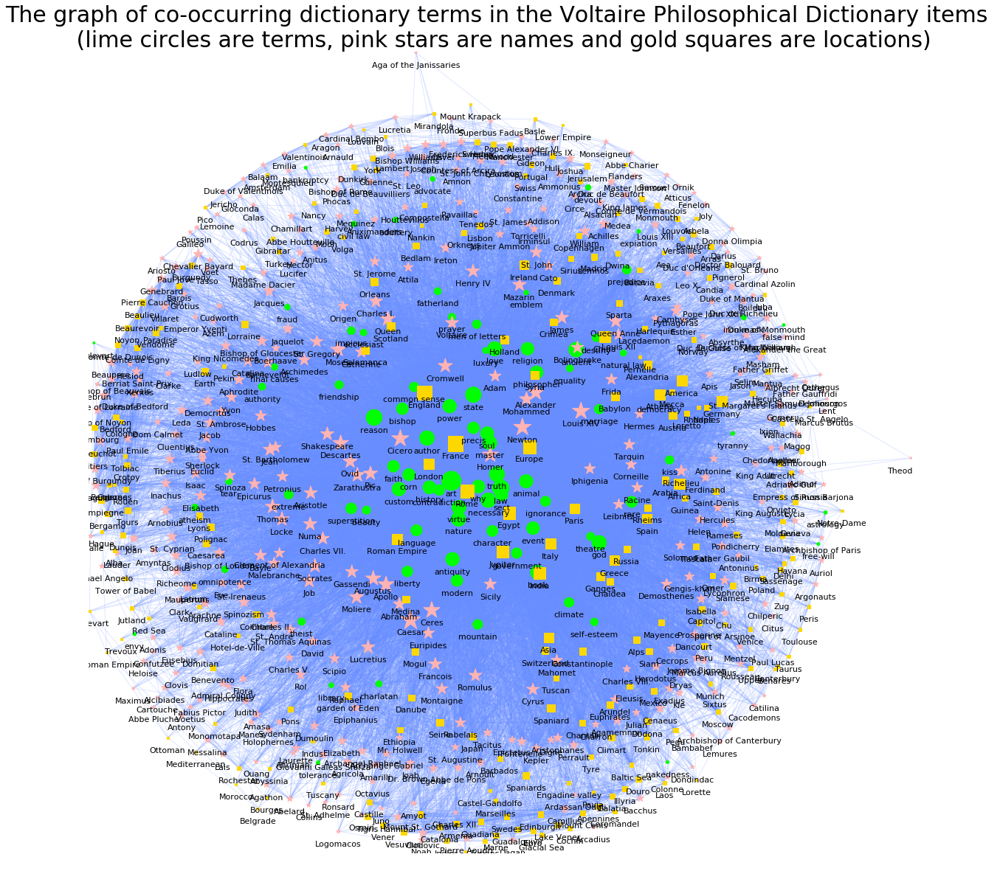

In [23]:
edge_width=[Gw[u][v]['weight'] for u,v in Gw.edges()]
# elabels = nx.get_edge_attributes(Gw,'weight')
# edge_width=[math.log(1+w) for w in edge_width]
# [3*w for w in edge_width] 

nsi1=[Gw.degree(n) for n in Gw.nodes() if n in nodeterms]
nsi2=[3*Gw.degree(n) for n in Gw.nodes() if n in nodenames]
nsi3=[Gw.degree(n) for n in Gw.nodes() if n in nodelocs]

figsize=(20,20)
pos=graphviz_layout(Gw) 

# print pos['Pic']
pos['Pic'] = (162.74, 136.11)
pos['Ovid'] = (156.52, 139.83) #(156.52, 145.83)
pos['reason'] = (163.83, 153.56) #(193.83, 153.56)
pos['Chu'] = (185.33, 161.76) #(190.33, 161.76)
pos['Achilles'] = (234.07, 213.93) #(228.07, 213.93)
pos['Ireland'] = (209.69, 201.23) #(205.69, 201.23)
pos['Cato'] = (217.17, 200.88) #(219.17, 200.88)
pos['Madrid']= (231, 203.8) #(229.76, 203.8)
pos['Pythagoras']=(256.07, 186.85) #(252.07, 184.85)
pos['Queen'] = (168.04, 184.41) #(161.04, 169.41)
pos['America']=(257.74, 165) #(257.74, 157.56)
pos['Germany'] = (270, 158.62) #(264.05, 148.62)
pos['prejudice'] = (240.97, 199.66) #(240.97, 185.66)
pos['religion'] = (210.7, 175) #(210.7, 168.34)
pos['kiss'] = (254.06, 140.3) #(259.06, 140.3)
pos['ecclesiast'] = (160.62, 180.08) #(157.62, 184.08)
pos['sect']=(202.83, 129.38) #(202.83, 137.38)
pos['truth']=(201.36, 135.87) #(201.36, 139.87)
pos['master'] =(199.17, 145.65) #(196.17, 145.65)
pos['contradiction']= (183.74, 130.93) #(187.74, 139.93)
pos['book'] = (213.75, 105.24) #(213.75, 130.24)
pos['god'] = (232.57, 114.49) #(232.57, 139.49)
pos['Athens']=(251.09, 160.73) #(247.09, 166.73)
pos['China']= (234.26, 178.79) #(234.26, 175.79)
pos['animal'] = (210.27, 133.64)  #(210.27, 153.64)
pos['Spain'] = (247.14, 121.99) #(247.14, 111.99)
pos['Africa'] = (257.09, 132.85) #(257.09, 127.85)
pos['Alexandria'] = (247.32, 170.06) #(242.32, 170.06)
pos['Paris'] = (225.01, 125.08) #(225.01, 132.08)
pos['ancient'] = (225.54, 174.74) #(225.54, 144.74)
pos['philosopher'] = (213.5, 167.66) #(213.5, 164.66)
pos['love'] = (200.67, 175.0) #(200.67, 157.0)
pos['London'] = (180.51, 139.08)#(180.51, 136.08)
pos['rare'] = (242.49, 127.23) #(239.29, 127.23)
pos['state'] = (194.14, 160.65) #(194.14, 158.65)
 # node_color={}
# for n in Gw.nodes():
#     if n in nodeterms:
#         node_color[n]="lime"
#     if n in nodenames:
#         node_color[n]="#ffb3b3"
#     if n in nodelocs:
#         node_color[n]="#gold"
node_border_color="r"
edge_color="#668cff"
plt.figure(figsize=figsize);
nodes1 = nx.draw_networkx_nodes(Gw, pos,nodelist=nodeterms, node_color="lime",node_size=nsi1)
nodes2 = nx.draw_networkx_nodes(Gw, pos,nodelist=nodenames, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
nodes3 = nx.draw_networkx_nodes(Gw, pos,nodelist=nodelocs, node_shape="s",node_color="gold",node_size=nsi3)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
nx.draw_networkx_edges(Gw, pos, edge_color=edge_color,width=edge_width,alpha=0.2)
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Gw.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -4 # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gw, yoffset,labels=labels_no,font_size=11);
sst="The graph of co-occurring dictionary terms in the Voltaire Philosophical Dictionary items \n (lime circles are terms, pink stars are names and gold squares are locations)"
plt.title(sst,fontsize=30);
plt.margins(x=0., y=0.) 

In [24]:
nodeterms=[n for n in Gw.nodes() if n in nterms]
nodenames=[n for n in Gw.nodes() if n in pnames]
nodelocs=[n for n in Gw.nodes() if n in lnames]

pos0=nx.circular_layout(nx.cycle_graph(3)) 

G1=Gw.subgraph(nodeterms)
sh1=[]
sh2=[]
sh3=[]
for i,n in enumerate(G1.nodes()):
    if i in range(15):
        sh1.append(n)
    elif i in range(15,47):
        sh2.append(n)
    else:
        sh3.append(n)
shells1=[sh1,sh2,sh3]
pos1=nx.shell_layout(G1, shells1) 

G2=Gw.subgraph(nodenames)
sh11=[]
sh22=[]
sh33=[]
sh44=[]
sh55=[]
sh66=[]
for i,n in enumerate(G2.nodes()):
    if i in range(15):
        sh11.append(n)
    elif i in range(15,45):
        sh22.append(n)
    elif i in range(45,90):
        sh33.append(n)
    elif i in range(90,160):
        sh44.append(n)
    elif i in range(160,240):
        sh55.append(n)
    else:
        sh66.append(n)
shells2=[sh11,sh22,sh33,sh44,sh55,sh66]
pos2=nx.shell_layout(G2, shells2) 

G3=Gw.subgraph(nodelocs)
sh111=[]
sh222=[]
sh333=[]
sh444=[]
sh555=[]
sh666=[]
for i,n in enumerate(G3.nodes()):
    if i in range(15):
        sh111.append(n)
    elif i in range(15,39):
        sh222.append(n)
    elif i in range(39,77):
        sh333.append(n)
    elif i in range(77,125):
        sh444.append(n)
    elif i in range(125,176):
        sh555.append(n)
    else:
        sh666.append(n)
shells3=[sh111,sh222,sh333,sh444,sh555,sh666]
pos3=nx.shell_layout(G3, shells3) 

def re_pos(pos,centre,radius):
    plist=[list(v) for v in pos.values()]
    nplist=[v for v in pos.values()]
    x = [p[0] for p in plist]
    y = [p[1] for p in plist]
    centroid = (sum(x) / float(len(plist)), sum(y) / float(len(plist)))
    ncentroid=np.array(centroid)
    rad=max([np.linalg.norm(nplist[i]-ncentroid) for i in range(len(nplist))])
    rpos={}
    for k,v in pos.items():
        rpos[k]=[(v[0]+centre[0])/float(radius),(v[1]+centre[1])/float(radius)]
    return rpos

centers=pos0.values()
centerm=[]
for i in range(len(centers)):
    t=[]
    for j in centers[i]:
        t.append(1.35*j)  #3* 2.7*
    centerm.append(np.array(t))
centers=centerm

# radius=1. #1.5
pos1=re_pos(pos1,centers[0],0.008) #radius)  
pos2=re_pos(pos2,centers[1],0.004) #radius)    
pos3=re_pos(pos3,centers[2],0.004) #radius) 

pos1['god']=[168.7499974904832, 95]                           #90[168.7499974904832, 83.3333391696215]
pos1['authority']=[164.39464390277863, 50]                    #[164.39464390277863, 41.438418999314344]
pos1['bankruptcy']=[195.00753194093704, 90]                   #[185.00753194093704, 81.7321125417948]
pos1['iron mask']= [190, 76.98996700346473]                   #[200.64028799533844, 76.98996700346473]
pos1['self-esteem']=[168.75000212683892, -96]                 #[168.75000212683892, -83.33333246409889]
pos1['prejudice']= [174.0551272407174, -130]                  #[174.0551272407174, -124.88736622035499]  
pos1['marriage']= [145, -90]                                  #[152.49246805906296, -81.7321058362722]
pos1['astrology']= [205, -30.96436187624928]                  #[196.6304451227188, -30.96436187624928]
pos1['event']= [164.39465088769794, -48]                      #[164.39465088769794, -41.438412293791735]
pos1['contradiction']= [128, -119.52083222568031]             #[132.14714154601097, -119.52083222568031]
pos1['expiation'] = [125, -84]                                #[136.85970082879066, -76.98996029794212]
pos1['government']= [145, 90]                                 #[152.4924736469984, 81.7321125417948]
pos1['theist']= [115, 72.28914375603202]                      #[122.45248332619668, 69.28914375603202]
pos1['democracy']= [215.04752039909363, 73]                   #[215.04752039909363, 69.28913630545142]
pos1['omnipotence']= [245, -106.44114427268501]               #[234.2884063720703, -106.44114427268501]

# pos2['Pierre Cauchon']=[-177.46072057634615, 204]#[-177.46072057634615, 209.40674684726773]
# pos2['Paul Emile']=[-177.46073547750734, 381]#[-177.46073547750734, 375.16040943347986]
# pos2['Richelieu']=[-138, 378]#[-142.998609505594, 371.53829477512414]
# pos2['Circe']=[-164.38761055469536, 163]#[-164.38761055469536, 167.35972307407437]
# pos2['Duc de Richelieu']=[-181.81608784943842, 424]#[-181.81608784943842, 416.5988176294523]
# pos2['Rol']=[-130.12290354818128, 415]#[-130.12290354818128, 411.16564564191873]
# pos2['Hannibal']=[-173.1053742580118, 246]#[-173.1053742580118, 250.84516249382077]
# pos2['Jupiter Ammon']=[-147.0439972355964, 411]#[-147.0439972355964, 415.38454435550744]
# pos2['Donna Olimpia']=[-98, 258.3888678976256]#[-92.62122940272116, 258.3888678976256]
# pos2['Madame Dacier']=[-205.83686213940405, 122]#[-205.83686213940405, 129.79559443676052]
# pos2['Lucretia']=[-131.66318442672514, 123]#[-131.66318442672514, 129.79559443676052]
# pos2['Catalina']=[-201.34054850786947, 80]#[-201.34054850786947, 86.5151866503912]
# pos2['Elisabeth']=[-115, 81]#[-120.11555563658499, 89.70652363979397]
# pos2['Archimedes']=[-199, 38]#[-194.88211143761896, 43.65309916221677]
# pos2['Aniximanders']=[-160.0251987576487, 36]#[-160.0251987576487, 42.435868007774936]
# pos2['Messalina']=[-205.83685096353315, 463]#[-205.83685096353315, 454.77156184398706]
# pos2['William']=[-176.22748697176598, 472]#[-176.22748697176598, 458.78243289672906]
# pos2['Queen Anne']=[-138, 473]#[-146.37781102210306, 457.44187973224695]
# pos2['Inachus']=[-185.0956602022054, 504]#[-185.0956602022054, 499.97468136035974]
# pos2['Clodius']=[-152.40438263863348, 505]#[-152.40438263863348, 499.97468136035974]
# pos2['Montesquieu']=[-194.8821542784574, 547]#[-194.8821542784574, 540.9140571185309]
# pos2['Clarke']=[-160.02515219151996, 547]#[-160.02515219151996, 542.1312882729727]
# pos2['Numa']=[-125.33796932548307, 545]#[-125.33796932548307, 538.4855105706412]
# pos2['Lucifer']=[-136.1595055088403, 502]#[-136.1595055088403, 498.0519845315176]
# pos2["Archbishop of Canterbury"]=[83, 333] #[78.81698776036477, 327.07685075485284]
# pos2['Beuchot']=[-157, 480] #[-161.27255726605677, 458.78241799556787]
# pos2['Admiral Coligny' ]= [-145.66319560259603, 460.77156184398706] #[-131.66319560259603, 454.77156184398706]
# pos2["Paul Jove"] = [-117.24719386547827, 453.7930114098745] #[-117.24719386547827, 450.7930114098745]
# pos2["Queen"] = [-160.03932878375076, 190] #[-160.03932878375076, 209.40674684726773]
# pos2["Antonine"] = [-137, 208] #[-142.9985983297231, 213.02886895620404]

pos3['Hull']= [-145, -340]                                         #[-155.8742623776195, -331.91093943798126]
pos3['Prosperine'] = [-200.70659909397338, -505]                   #[-200.70659909397338, -498.15138198220313]
pos3['Burgundy']= [-173.1053309515116, -240]                       #[-168.74998255344354, -125.61691321217599]
pos3['Monomotapa']= [-249.243797548115, -318]                      #[-249.243797548115, -313.85184220754684]
pos3['Castello St. Angelo']= [-179.07239757478212, -425]           #[-179.07239757478212, -416.85664422595084]
pos3['Mount Krapack']= [-168.74998255344354, -115]                 #[-168.74998255344354, -125.61691321217599]
pos3['Orleans']= [-108, -446.26349724614204]                       #[-104.96936906129098, -446.26349724614204]
pos3['Taurus']= [-133.1712173297999, -545]                         #[-175.1656055450437, -84.04906607949319]
pos3['Comte de Vermandois']= [-180.64543958753322, -30]            #[-180.64543958753322, -42.56675161206308]
pos3['Comte de Dunois']=[-105, -535.2364829906185]                 #[-109.8102385178206, -535.2364829906185]
pos3['Guadalquivir']  =  [-168.7499732807313, -465]                #[-168.7499732807313, -458.95025647961677]
pos3['Valentinois']=[-168.74997781394987, -195]                    #[-168.74997781394987, -208.9502490290362]
pos3['Nankin']= [-258, -147.94602013909403]                        #[-252.083318121731, -147.94602013909403]
pos3[ 'Medina']=  [-179.07239012420152, -155]                      #[-179.07239012420152, -167.71052546584193]
pos3['Mecca']=[-158.4275539964435, -160]                           #[-158.4275539964435, -167.71052546584193]
pos3["St. Margaret's Islands"]=[-199.43565856665347, -165]         #[-199.43565856665347, -171.10854901158396]
# pos3['Mediterranean']=[-199.43565856665347, -162]                #[-199.43565856665347, -171.10854901158396]
pos3['Roman Empire']=[-160, -40]                                   #[-156.85449987649892, -42.56675161206308]


posAll=dict(pos1.items()+pos2.items()+pos3.items()+[(k,pos1[k]+pos2[k]+pos3[k]) for k in set(pos3)&set(pos2)&set(pos1)])

In [25]:
pos2

{'Abbe Charier': [-210.41668560355924, 220.11478833639202],
 'Abbe Houtteville': [-286.2116022035482, 249.53105889045773],
 'Abbe Pluche': [57.968564517795805, 186.9333072730261],
 'Abbe Yvon': [-160.03932878375076, 209.40674684726773],
 'Abbe de Pons': [-293.44553481787466, 301.00313696795286],
 'Abelard': [-104.37145810574316, 94.14681635582028],
 'Abraham': [-21.43611740320944, 439.5974858828741],
 'Absyrthe': [-185.0956602022054, 499.97468136035974],
 'Achilles': [-33.913858048618074, 390.247790438767],
 'Adam': [-210.83928253501676, 538.7150927611548],
 'Addison': [-2.7543080970647282, 307.2234600015837],
 'Adimo': [-234.25421845167898, 139.0289499589163],
 'Admiral Coligny': [-311.8248356506231, 377.76677153789575],
 'Adonis': [18.37763953953958, 126.50288484775601],
 'Aga of the Janissaries': [-210.41669677943014, 364.45236049377496],
 'Agamemnon': [73.9854352548716, 232.45468951546727],
 'Agathon': [-91.49574469774984, 54.5194580384451],
 'Agricola': [-279.11847811192297, 233.5

In [26]:
# sorted(sh666)

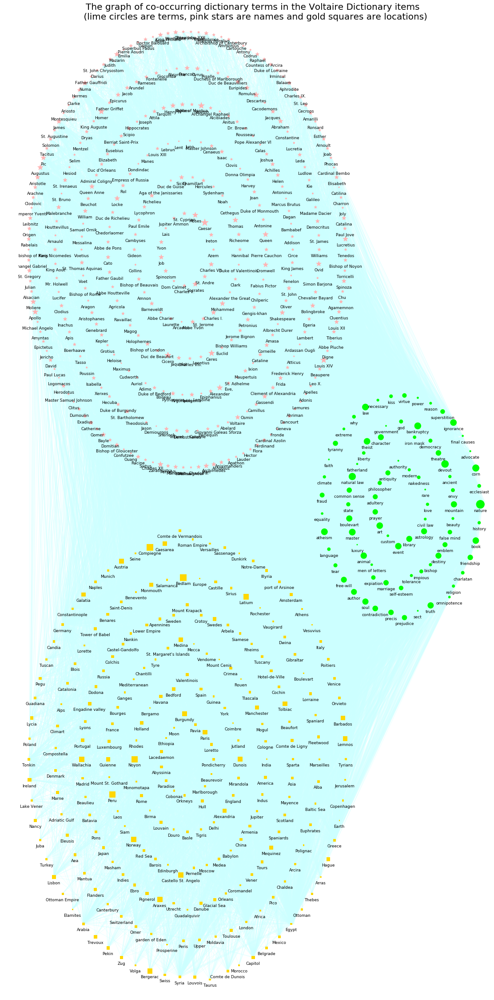

In [27]:
edge_width=[Gw[u][v]['weight'] for u,v in Gw.edges()]

plt.figure(figsize=(19,40))
node_border_color="r"
edge_color="#ccffff" #"#e6f9ff" #"#668cff" #"#668cff"

nsi1=[0.5*Gw.degree(n) for n in nodeterms] 
nsi2=[Gw.degree(n) for n in nodenames]
nsi3=[0.5*Gw.degree(n) for n in nodelocs]

nodeterms=[n for n in G1.nodes() if n in nodeterms]
nodenames=[n for n in G2.nodes() if n in nodenames]
nodelocs=[n for n in G3.nodes() if n in nodelocs]
nodes1 = nx.draw_networkx_nodes(G1, pos=pos1,nodelist=nodeterms,node_size=nsi1, node_color="lime")
nodes2 = nx.draw_networkx_nodes(G2, pos=pos2,nodelist=nodenames,node_size=nsi2, node_shape="*", node_color="#ffb3b3")
nodes3 = nx.draw_networkx_nodes(G3, pos=pos3,nodelist=nodelocs,node_size=nsi3, node_shape="s",node_color="gold")
# nx.draw_networkx_nodes(G5,pos=pos5,node_size=nsi5,nodelist=c5,node_color='cyan',alpha=1.);
# nx.draw_networkx_nodes(G6,pos=pos6,node_size=nsi6,nodelist=c6,node_color='magenta',alpha=1.);

nx.draw_networkx_edges(Gw, posAll, edge_color=edge_color,width=edge_width,alpha=0.4)
# nx.draw_networkx_labels(CGwi,posAll,labels=labels,font_size=13); 

# nx.draw_networkx_edges(G,pos=pos,edge_color='b',width=edgewidth,alpha=0.2);
# nx.draw_networkx_labels(G,pos=pos,labels=labels,font_size=25);

# plt.axis('off');
# yoffset = {}
# y_off = -0.16 # offset on the y axis
# for k, v in posAll.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gw, yoffset, font_size=16);
# sst="The %i communities of the graph of %s" %(kk,name)
# plt.title(sst,fontsize=20);
# plt.margins(x=0.3, y=0.1) 


# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Gw.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -7 # offset on the y axis
for k, v in posAll.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gw, yoffset,labels=labels_no,font_size=9);
sst="The graph of co-occurring dictionary terms in the Voltaire Dictionary items \n (lime circles are terms, pink stars are names and gold squares are locations)"
plt.title(sst,fontsize=20);
plt.margins(x=0.02, y=0.01) 

## 2. The Subgraphs of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations 

In [42]:
# print len(nodeterms),"terms"
# print len(nodenames),"names"
# print len(nodelocs),"locations"
Gch=Gw.subgraph(nodenames)
print "The number of nodes (characters) of Gch is", len(Gch.nodes())
print "The number of edges (character co-occurrences) of Gch is", len(Gch.edges())
print "The density of Gch is %.3f" %nx.density(Gch)
if nx.is_connected(Gch)==True:
    print "Gch is a connected graph"
else:
    print "Gch is a disconnected graph and it has",nx.number_connected_components(Gch),"connected components"
giant = max(nx.connected_component_subgraphs(Gch), key=len)
Gchl=Gch.subgraph(giant)
print "The largest connected component of Gch is a weighted graph with %i nodes and %i edges" %(len(Gchl.nodes()),len(Gchl.edges()))
print "The density of the largest connected component of Gch is %.3f" %nx.density(Gchl)


The number of nodes (characters) of Gch is 352
The number of edges (character co-occurrences) of Gch is 3905
The density of Gch is 0.063
Gch is a connected graph
The largest connected component of Gch is a weighted graph with 352 nodes and 3905 edges
The density of the largest connected component of Gch is 0.063


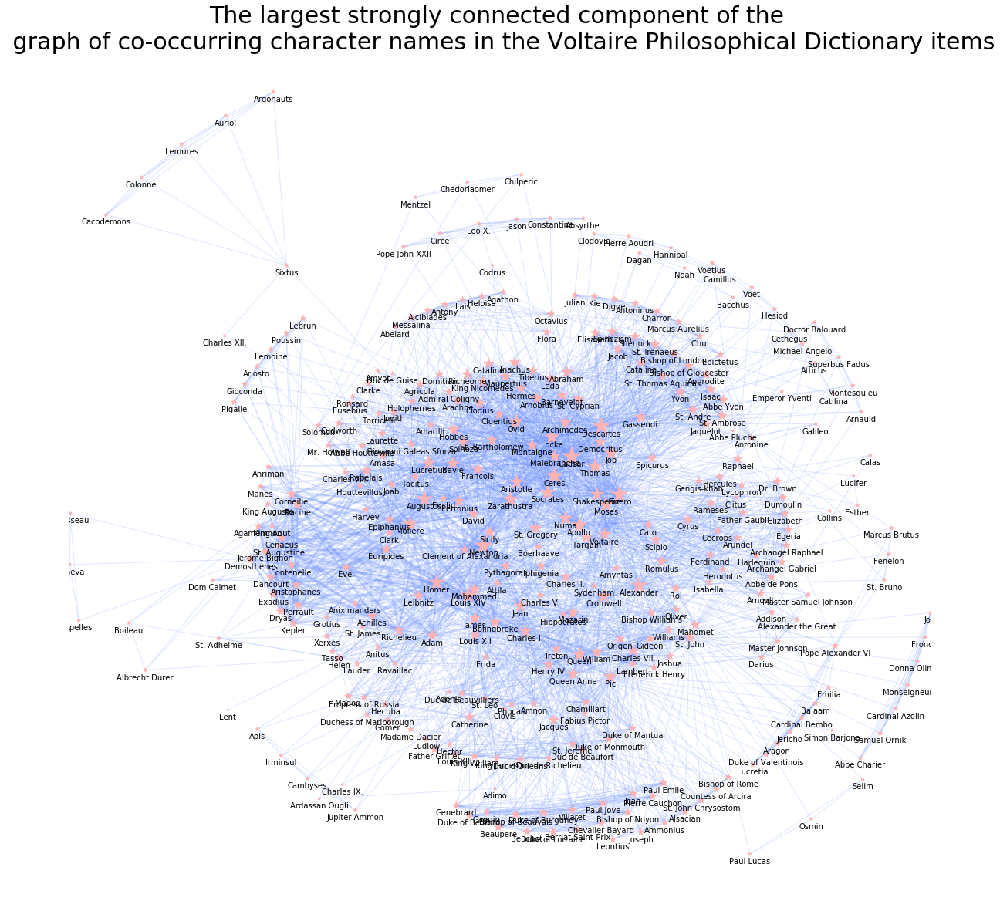

In [43]:
edge_width=[Gchl[u][v]['weight'] for u,v in Gchl.edges()]
# elabels = nx.get_edge_attributes(Gw,'weight')
# edge_width=[math.log(1+w) for w in edge_width]
# [3*w for w in edge_width] 

# nsi1=[Gch.degree(n) for n in Gch.nodes() if n in nodeterms]
nsi2=[5*Gchl.degree(n) for n in Gchl.nodes() if n in nodenames]
# nsi3=[Gw.degree(n) for n in Gw.nodes() if n in nodelocs]

figsize=(20,20)
pos=graphviz_layout(Gchl) 

node_border_color="r"
edge_color="#668cff"
plt.figure(figsize=figsize);
# nodes1 = nx.draw_networkx_nodes(Gch, pos,nodelist=nodeterms, node_color="lime",node_size=nsi1)
nodenames=[n for n in Gchl.nodes() if n in nodenames]
nodes2 = nx.draw_networkx_nodes(Gchl, pos,nodelist=nodenames, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
# nodes3 = nx.draw_networkx_nodes(Gw, pos,nodelist=nodelocs, node_shape="s",node_color="gold",node_size=nsi3)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
nx.draw_networkx_edges(Gchl, pos, edge_color=edge_color,width=edge_width,alpha=0.2)
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Gchl.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -4 # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gchl, yoffset,labels=labels_no,font_size=10);
sst="The largest strongly connected component of the \n graph of co-occurring character names in the Voltaire Philosophical Dictionary items"
plt.title(sst,fontsize=30);
plt.margins(x=0., y=0.05) 

In [31]:
Glo=Gw.subgraph(nodelocs)
print "The number of nodes (locations) of Glo is", len(Glo.nodes())
print "The number of edges (location co-occurrences) of Glo is", len(Glo.edges())
print "The density of Gch is %.3f" %nx.density(Glo)
if nx.is_connected(Glo)==True:
    print "Glo is a connected graph"
else:
    print "Glo is a disconnected graph and it has",nx.number_connected_components(Glo),"connected components"
giant = max(nx.connected_component_subgraphs(Glo), key=len)
Glol=Glo.subgraph(giant)
print "The largest connected component of Glo is a weighted graph with %i nodes and %i edges" %(len(Glol.nodes()),len(Glol.edges()))
print "The density of the largest connected component of Glo is %.3f" %nx.density(Glol)

The number of nodes (locations) of Glo is 242
The number of edges (location co-occurrences) of Glo is 2766
The density of Gch is 0.095
Glo is a disconnected graph and it has 5 connected components
The largest connected component of Glo is a weighted graph with 238 nodes and 2766 edges
The density of the largest connected component of Glo is 0.098


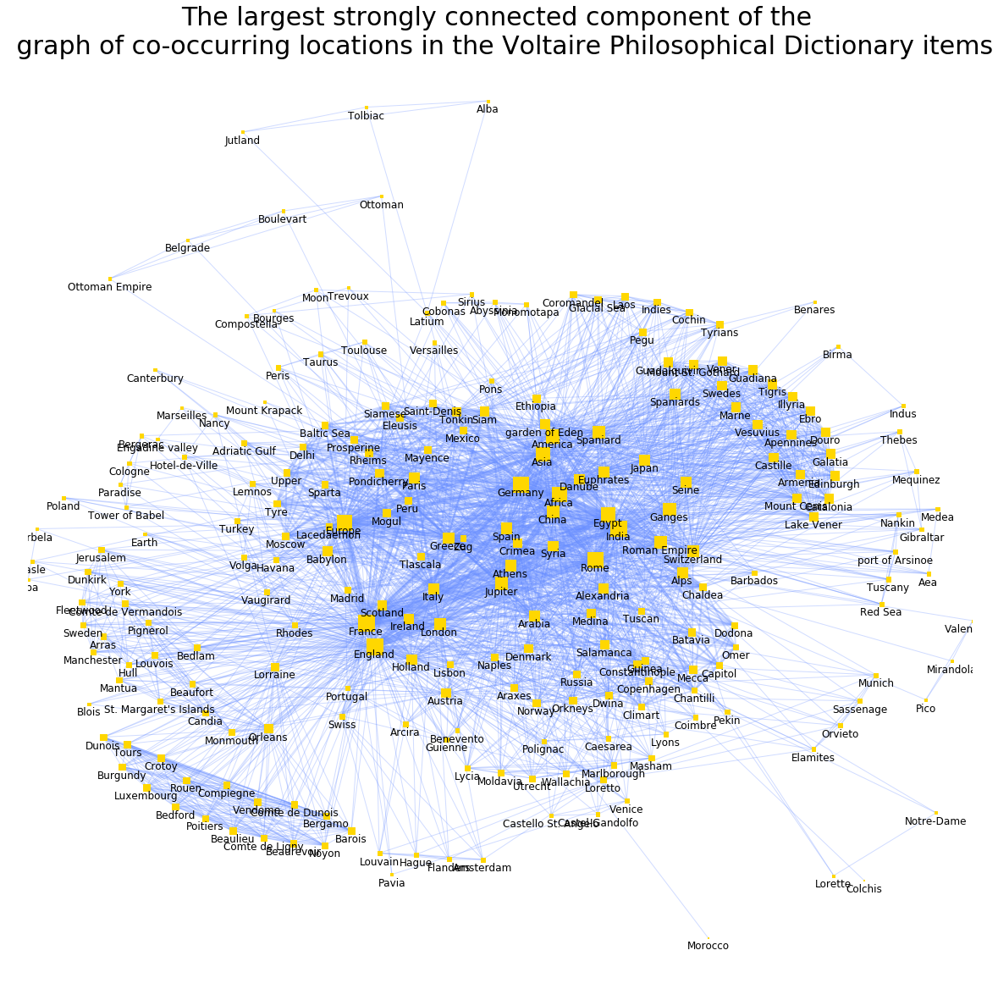

In [32]:
edge_width=[Glol[u][v]['weight'] for u,v in Glol.edges()]
# elabels = nx.get_edge_attributes(Gw,'weight')
# edge_width=[math.log(1+w) for w in edge_width]
# [3*w for w in edge_width] 

# nsi1=[Gch.degree(n) for n in Gch.nodes() if n in nodeterms]
# nsi2=[5*Gchl.degree(n) for n in Gchl.nodes() if n in nodenames]
nsi3=[3*Glol.degree(n) for n in Glol.nodes() if n in nodelocs]

figsize=(20,20)
pos=graphviz_layout(Glol) 

node_border_color="r"
edge_color="#668cff"
plt.figure(figsize=figsize);
# nodes1 = nx.draw_networkx_nodes(Gch, pos,nodelist=nodeterms, node_color="lime",node_size=nsi1)
nodelocs=[n for n in Glol.nodes() if n in nodelocs]
# nodes2 = nx.draw_networkx_nodes(Glol, pos,nodelist=nodenames, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
nodes3 = nx.draw_networkx_nodes(Glol, pos,nodelist=nodelocs, node_shape="s",node_color="gold",node_size=nsi3)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
nx.draw_networkx_edges(Glol, pos, edge_color=edge_color,width=edge_width,alpha=0.3)
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Glol.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -4 # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Glol, yoffset,labels=labels_no,font_size=12);
sst="The largest strongly connected component of the \n graph of co-occurring locations in the Voltaire Philosophical Dictionary items"
plt.title(sst,fontsize=30);
plt.margins(x=0., y=0.05) 

In [33]:
Gte=Gw.subgraph(nodeterms)
print "The number of nodes (terms) of Gte is", len(Gte.nodes())
print "The number of edges (term co-occurrences) of Gte is", len(Gte.edges())
print "The density of Gte is %.3f" %nx.density(Gte)
if nx.is_connected(Gte)==True:
    print "Gte is a connected graph"
else:
    print "Gte is a disconnected graph and it has",nx.number_connected_components(Gte),"connected components"
# giant = max(nx.connected_component_subgraphs(Gte), key=len)
# Gtel=Gte.subgraph(giant)
# print "The largest connected component of Gte is a weighted graph with %i nodes and %i edges" %(len(Gtel.nodes()),len(Gtel.edges()))
# print "The density of the largest connected component of Gte is %.3f" %nx.density(Gtel)


The number of nodes (terms) of Gte is 84
The number of edges (term co-occurrences) of Gte is 1858
The density of Gte is 0.533
Gte is a connected graph


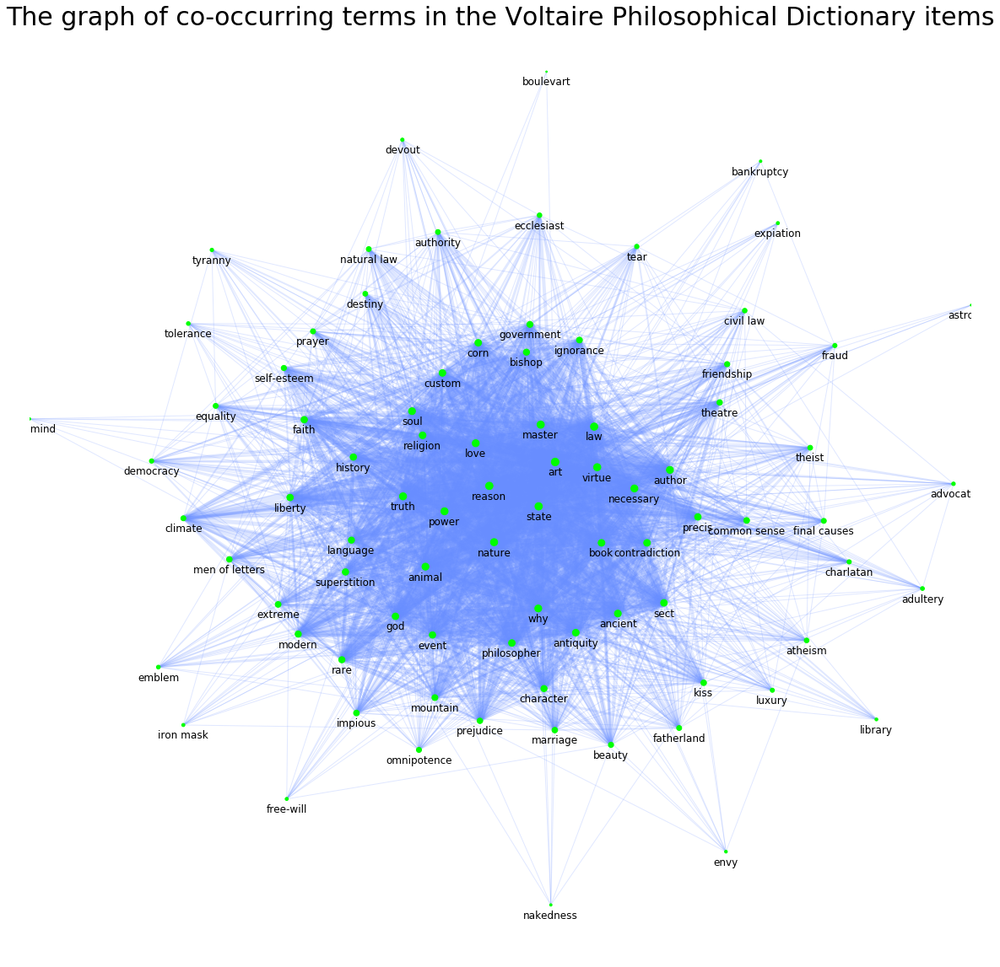

In [34]:
edge_width=[Gte[u][v]['weight'] for u,v in Gte.edges()]
# elabels = nx.get_edge_attributes(Gw,'weight')
# edge_width=[math.log(1+w) for w in edge_width]
# [3*w for w in edge_width] 

nsi1=[Gte.degree(n) for n in Gte.nodes() if n in nodeterms]
# nsi2=[5*Gchl.degree(n) for n in Gchl.nodes() if n in nodenames]
# nsi3=[3*Glol.degree(n) for n in Glol.nodes() if n in nodelocs]

figsize=(20,20)
pos=graphviz_layout(Gte) 

node_border_color="r"
edge_color="#668cff"
plt.figure(figsize=figsize);
nodeterms=[n for n in Gte.nodes() if n in nodeterms]
nodes1 = nx.draw_networkx_nodes(Gte, pos,nodelist=nodeterms, node_color="lime",node_size=nsi1)
# nodelocs=[n for n in Glol.nodes() if n in nodelocs]
# nodes2 = nx.draw_networkx_nodes(Glol, pos,nodelist=nodenames, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
# nodes3 = nx.draw_networkx_nodes(Glol, pos,nodelist=nodelocs, node_shape="s",node_color="gold",node_size=nsi3)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
nx.draw_networkx_edges(Gte, pos, edge_color=edge_color,width=edge_width,alpha=0.2)
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Gte.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -3 # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Glol, yoffset,labels=labels_no,font_size=12);
sst="The graph of co-occurring terms in the Voltaire Philosophical Dictionary items"
plt.title(sst,fontsize=30);
plt.margins(x=0., y=0.05) 

In [51]:
def create_centralities_list(G,maxiter=2000,pphi=5,centList=[]):
    if len(centList)==0:
        centList=['degree','closeness','betweenness','eigenvector','Katz','PageRank','HITS','load','communicability','current flow']
    cenLen=len(centList)
    valus={}
    for uu,centr in enumerate(centList):
        if centr=='degree':
            if isinstance(G,nx.DiGraph):
                cent=nx.in_degree_centrality(G)
                sstt='In Degree Centralities '
                valus['in_degree']=cent
                cent=nx.out_degree_centrality(G)
                sstt+= 'and Out Degree Centralities'
                valus['out_degree']=cent
            else:
                cent=nx.degree_centrality(G)
                sstt='Degree Centralities'
                ssttt='degree centrality'
                valus[centr]=cent
        elif centr=='closeness':
            cent=nx.closeness_centrality(G)
            sstt='Closeness Centralities'
            ssttt='closeness centrality'
            valus[centr]=cent
        elif centr =='load':
            cent=nx.load_centrality(G)
            sstt='Load Centraities'
            valus[centr]=cent
        elif centr == 'communicability':
            if not isinstance(G, nx.DiGraph):
                cent=nx.communicability_betweenness_centrality(G)
                sstt='Communicability Centralities'
                valus[centr]=cent
        elif centr=='betweenness':
            cent=nx.betweenness_centrality(G)
            sstt='Betweenness Centralities'
            ssttt='betweenness centrality'
            valus[centr]=cent
        elif centr=='current flow':
            if not isinstance(G, nx.DiGraph):
            
                cent=nx.current_flow_closeness_centrality(G)
                sstt='Current Flow Closeness Centrality'
                valus[centr]=cent
        elif centr=='eigenvector':
            try:
                cent=nx.eigenvector_centrality(G,max_iter=maxiter)
                sstt='Eigenvector Centralities'
                ssttt='eigenvector centrality'
                valus[centr]=cent

            except:
                valus[centr]=None

                continue
        elif centr=='Katz':
            phi = (1+math.sqrt(pphi))/2.0 # largest eigenvalue of adj matrix
            cent=nx.katz_centrality_numpy(G,1/phi-0.01)
            cent=nx.katz_centrality_numpy(G,.05)#,1/phi-0.01)
            
            sstt='Katz Centralities'
            ssttt='Katz centrality'
            valus[centr]=cent
#             valus[centr+'_%i' %pphi]=cent

        elif centr=='PageRank':
            try:
                cent=nx.pagerank(G)
                sstt='PageRank'
                ssttt='pagerank'
                valus[centr]=cent

            except:
                valus[centr]=None

                continue
        elif centr=='HITS':
            if isinstance(G,nx.DiGraph):
                dd=nx.hits(G,max_iter=maxiter)
                sstt='HITS hubs '
                valus['HITS_hubs']=dd[0]
                sstt+= 'and HITS authorities'
                valus['HITS_auths']=dd[1]
            else:
                dd=nx.hits(G,max_iter=maxiter)
                cent=nx.degree_centrality(G)
                sstt='HITS'
                ssttt='HITS Centralities'
                valus[centr]=dd[0]
        else:
            continue
#         print '%s done!!!' %sstt
    return valus

dindices=['out_degree','in_degree','closeness','betweenness','eigenvector','HITS_hubs','HITS_auths','Katz','PageRank','load']
indices=['degree','closeness','betweenness','eigenvector','HITS','Katz','PageRank','load','communicability','current flow']
# indices=['degree','closeness','betweenness','eigenvector']

# Without 'communicability' and 'current flow' (undirected case)
dindicesd=['out_degree','in_degree','closeness','betweenness','eigenvector','HITS_hubs','HITS_auths','Katz','PageRank','load']
indicesd=['degree','closeness','betweenness','eigenvector','HITS','Katz','PageRank','load']
# indicesd=['degree','closeness','betweenness','eigenvector']

dindicesdr=dindices
indicesdr=indices

# Plus 'node'
dindicesdrn=["node"]+dindices
indicesdrn=['node']+indices

def central_df(G,node,central_pd):
    central_pd[node]=central_pd.index.values
    if isinstance(G,nx.DiGraph):
        central_pd=central_pd[[node]+dindices]
    else:
        central_pd=central_pd[[node]+indices]
    central_pd[node]=central_pd.index.values
    central_pd.reset_index(drop = True, inplace = True)
    # central_pd=central_pd[['node']]
    central_pd.sort_values(node) #.head()
    # central_pd['node']=G.nodes()
    return central_pd

## 3. Communities of the Graph of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations in Dictionary Items

The largest strongly connected component of the graph 
 of co-occurring character names in the Voltaire Philosophical Dictionary items contains 352 nodes and 3905 edges


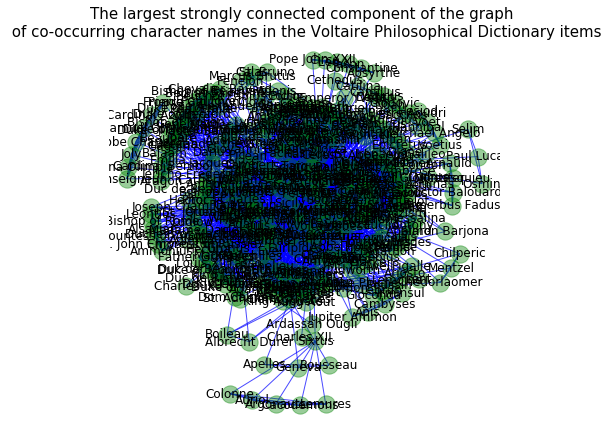

In [50]:
# Copy, paste and run cell 3 here:
name='The largest strongly connected component of the graph \n of co-occurring character names in the Voltaire Philosophical Dictionary items'
# G1=sorted(nx.connected_component_subgraphs(Gch), key=len, reverse=True)
# Gc1=G.subgraph(G1[0])
# G=nx.Graph(Gc1)
# size=50 # less than 100
# sample=random.sample(Gc1.nodes(),size)
# Gs=Gc1.subgraph(sample)
G=nx.Graph(Gchl)

print "%s contains %i nodes and %i edges" %(name, len(G.nodes()),len(G.edges()))

pos=graphviz_layout(G)
plt.figure(figsize=(7,7));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4)
nx.draw_networkx_edges(G, pos,arrowsize=20, edge_color="b", alpha=0.7)
nx.draw_networkx_labels(G, pos)
plt.axis('off');
plt.title(name,fontsize=15);

The graph has 9 communities and modularity coefficient equal to 0.517553146369
Community 0 with 62 nodes: ['Duchess of Marlborough', 'Dom Calmet', 'Cambyses', 'Laurette', 'Houttevillus', 'Hecuba', 'Joab', 'Giovanni Galeas Sforza', 'Harvey', 'Frida', 'Antoninus', 'Ardassan Ougli', 'Zarathustra', 'Lent', 'Manes', 'Simon Barjona', 'Empress of Russia', 'Jupiter Ammon', 'Julian', 'Charron', 'Abbe Houtteville', 'Agricola', 'Amarilli', 'Petronius', 'Holophernes', 'Irminsul', 'Codrus', 'Marcus Aurelius', 'Euclid', 'Montaigne', 'Ravaillac', 'Judith', 'Helen', 'Hermes', 'Adam', 'Anitus', 'Tacitus', 'Admiral Coligny', 'Epictetus', 'David', 'Magog', 'Gomer', 'Domitian', 'Adimo', 'St. James', 'Antonine', 'Pythagoras', 'Epiphanius', 'Eve,', 'St. Adhelme', 'Aniximanders', 'Amasa', 'Mohammed', 'St. Augustine', 'Bolingbroke', 'Ahriman', 'Apis', 'Kie', 'Digne', 'Abbe Pluche', 'Chu ', 'Torricelli']
Community 1 with 57 nodes: ['Ireton', 'Alsacian', 'Ammonius', 'Father Griffet', 'King Auguste', 'Joshua', '

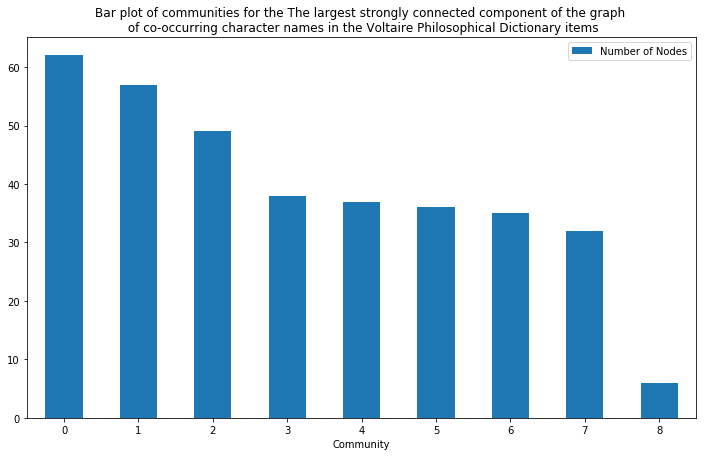

In [51]:
# Copy, paste and run cell 4 here:
partition = community.best_partition(G)
# print partition

kk=len(set(partition.values()))
modularity=community.modularity(partition, G, weight='weight')
print 'The graph has', kk, 'communities and modularity coefficient equal to', modularity

cml=[]
for j in range(kk):
    cj=[]
    for k,v in partition.items():
        if v==j:
            cj.append(k)
    cml.append(cj)
cmd={}
for j in range(kk):
    cmd[tuple(cml[j])]=len(cml[j])
cmd
ocmd=sorted(cmd.iteritems(), key=operator.itemgetter(1), reverse=True)
eocmd=enumerate(ocmd)
commsd={}
louvain_comm_membership={}
for i in eocmd:
    print 'Community', i[0], 'with', i[1][1], 'nodes:', list(i[1][0])
    commsd[i[0]]=i[1][1] 
    ts=list(i[1][0])
    louvain_comm_membership[i[0]]=ts 
    
ddf=pd.DataFrame(commsd.items(), columns=['Community', 'Number of Nodes'])
sst="Bar plot of communities for the %s" %name
ddf.plot.bar(x='Community', y='Number of Nodes', figsize=(12,7),rot=0,title=sst);

In [54]:
# Copy, paste and run cell 5 here:
# BELOW YOU NEED TO HOLD ONLY AS MANY COMMUNITIES AS YOU HAVE FOUND IN THE PREVIOUS CELL.
# POSSIBLY YOU MIGHT NEED TO UPDATE (COMMENT OUT OR ADD IN) COMMANDS AS "if p== ...", "G5 = ...", "pos5= ...", "For 5 communities ..."

pos0=nx.circular_layout(nx.cycle_graph(kk)) #kk=4 is the number communities

ocmd=sorted(cmd.iteritems(), key=operator.itemgetter(1), reverse=True)
eocmd=enumerate(ocmd)
for p,q in list(eocmd):
    if p==0:
        c1=list(list(q)[0])
    if p==1:
        c2=list(list(q)[0])
    if p==2:
        c3=list(list(q)[0])
    if p==3:
        c4=list(list(q)[0])
    if p==4:
        c5=list(list(q)[0])
    if p==5:
        c6=list(list(q)[0])
    if p==6:
        c7=list(list(q)[0])
    if p==7:
        c8=list(list(q)[0])
    if p==8:
        c9=list(list(q)[0])

G1=G.subgraph(c1)
pos1=nx.circular_layout(G1) 

G2=G.subgraph(c2)
pos2=nx.circular_layout(G2) 

G3=G.subgraph(c3)
pos3=nx.circular_layout(G3) 

G4=G.subgraph(c4)
pos4=nx.circular_layout(G4) 

G5=G.subgraph(c5)
pos5=nx.circular_layout(G5)

G6=G.subgraph(c6)
pos6=nx.circular_layout(G6) 

G7=G.subgraph(c7)
pos7=nx.circular_layout(G7) 

G8=G.subgraph(c8)
pos8=nx.circular_layout(G8)

G9=G.subgraph(c9)
pos9=nx.circular_layout(G9)

def re_pos(pos,centre,radius):
    plist=[list(v) for v in pos.values()]
    nplist=[v for v in pos.values()]
    x = [p[0] for p in plist]
    y = [p[1] for p in plist]
    centroid = (sum(x) / float(len(plist)), sum(y) / float(len(plist)))
    ncentroid=np.array(centroid)
    rad=max([np.linalg.norm(nplist[i]-ncentroid) for i in range(len(nplist))])
    rpos={}
    for k,v in pos.items():
        rpos[k]=[(v[0]+centre[0])/float(radius),(v[1]+centre[1])/float(radius)]
    return rpos

centers=pos0.values()
centerm=[]
for i in range(len(centers)):
    t=[]
    for j in centers[i]:
        t.append(3*j)  
    centerm.append(np.array(t))
centers=centerm

radius=2. #1.5
pos1=re_pos(pos1,centers[0],radius)  
pos2=re_pos(pos2,centers[1],radius)    
pos3=re_pos(pos3,centers[2],radius) 
pos4=re_pos(pos4,centers[3],radius)
pos5=re_pos(pos5,centers[4],radius)
pos6=re_pos(pos6,centers[5],radius) 
pos7=re_pos(pos7,centers[6],radius)
pos8=re_pos(pos8,centers[7],radius)
pos9=re_pos(pos9,centers[8],radius)


# For 2 communities
# posAll=dict(pos1.items()+pos2.items()+[(k,pos1[k]+pos2[k]) for k in set(pos2)&set(pos1)])

# For 3 communities
# posAll=dict(pos1.items()+pos2.items()+pos3.items()+[(k,pos1[k]+pos2[k]+pos3[k]) for k in set(pos3)&set(pos2)&set(pos1)])

# For 4 communities
# posAll=dict(pos1.items()+pos2.items()+pos3.items()+pos4.items()+[(k,pos1[k]+pos2[k]+pos3[k]+pos4[k]) for k in set(pos4)&set(pos3)&set(pos2)&set(pos1)])

# For 5 communities
# posAll=dict(pos1.items()+pos2.items()+pos3.items()+pos4.items()+pos5.items()+[(k,pos1[k]+pos2[k]+pos3[k]+pos4[k]+pos5[k]) for k in set(pos5)&set(pos4)&set(pos3)&set(pos2)&set(pos1)])

# For 9 communities
posAll=dict(pos1.items()+pos2.items()+pos3.items()+pos4.items()+pos5.items()+pos6.items()+pos7.items()+pos8.items()+pos9.items()+[(k,pos1[k]+pos2[k]+pos3[k]+pos4[k]+pos5[k]+pos6[k]+pos7[k]+pos8[k]+pos9[k]) for k in set(pos9)&set(pos8)&set(pos7)&set(pos6)&set(pos5)&set(pos4)&set(pos3)&set(pos2)&set(pos1)])

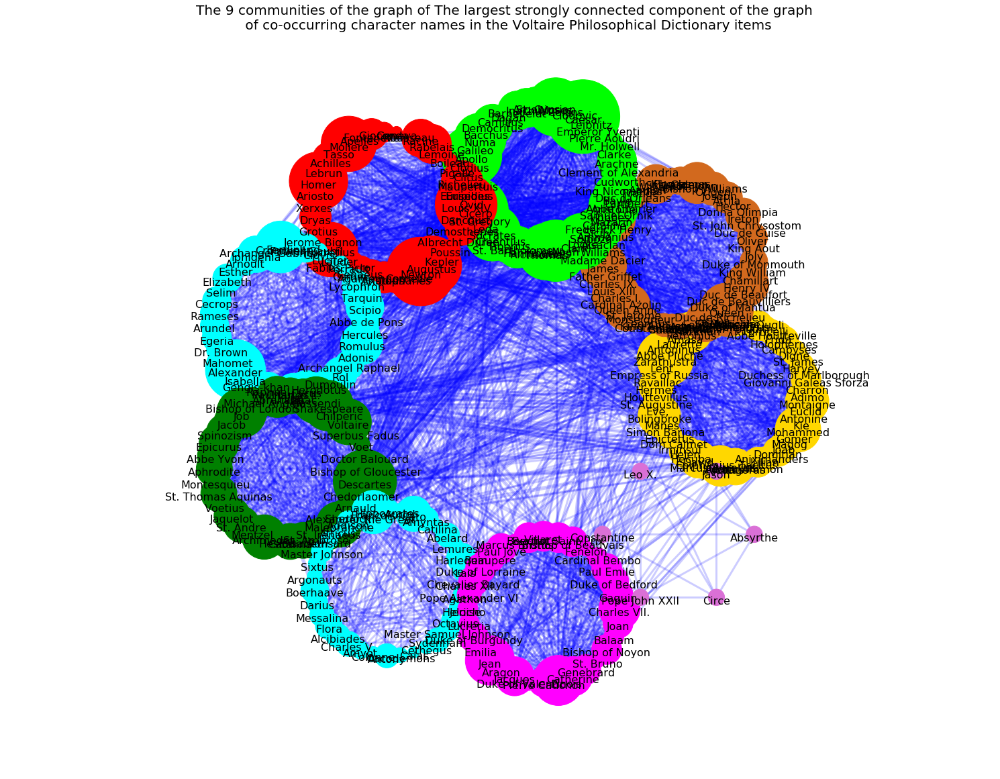

In [58]:
# Copy, paste and run cell 6 here:
# BELOW YOU NEED TO HOLD ONLY AS MANY COMMUNITIES AS YOU HAVE FOUND PREVIOUSLY.
# POSSIBLY YOU MIGHT NEED TO UPDATE (COMMENT OUT OR ADD IN) COMMANDS AS "nsi5 = ...", "nx.draw_networkx_nodes(G5, ..."
# YOU SHOULD ALSO UNTANGLE OVERLAPPING LABELS OR CHANGE THE LAYOUT OR EVEN CHANGE "radious" IN THE CELL ABOVE

plt.figure(figsize=(26,20))

nsi1=[100*G.degree(n) for n in c1] 
nsi2=[100*G.degree(n) for n in c2]
nsi3=[100*G.degree(n) for n in c3]
nsi4=[100*G.degree(n) for n in c4]
nsi5=[100*G.degree(n) for n in c5]
nsi6=[100*G.degree(n) for n in c6]
nsi7=[100*G.degree(n) for n in c7]
nsi8=[100*G.degree(n) for n in c8]
nsi9=[100*G.degree(n) for n in c9]

nx.draw_networkx_nodes(G1,pos=pos1,node_size=nsi1,nodelist=c1,node_color='gold',alpha=1.);
nx.draw_networkx_nodes(G2,pos=pos2,node_size=nsi2,nodelist=c2,node_color='chocolate',alpha=1.);
nx.draw_networkx_nodes(G3,pos=pos3,node_size=nsi3,nodelist=c3,node_color='lime',alpha=1.);
nx.draw_networkx_nodes(G4,pos=pos4,node_size=nsi4,nodelist=c4,node_color='red',alpha=1.);
nx.draw_networkx_nodes(G5,pos=pos5,node_size=nsi5,nodelist=c5,node_color='cyan',alpha=1.);
nx.draw_networkx_nodes(G6,pos=pos6,node_size=nsi6,nodelist=c6,node_color='green',alpha=1.);
nx.draw_networkx_nodes(G7,pos=pos7,node_size=nsi7,nodelist=c7,node_color='aqua',alpha=1.);
nx.draw_networkx_nodes(G8,pos=pos8,node_size=nsi8,nodelist=c8,node_color='magenta',alpha=1.);
nx.draw_networkx_nodes(G9,pos=pos9,node_size=nsi9,nodelist=c9,node_color='orchid',alpha=1.);

edge_width=3
nx.draw_networkx_edges(G, posAll, edge_color='b',width=edge_width,alpha=0.2)
# nx.draw_networkx_labels(CGwi,posAll,labels=labels,font_size=13); 

# nx.draw_networkx_edges(G,pos=pos,edge_color='b',width=edgewidth,alpha=0.2);
# nx.draw_networkx_labels(G,pos=pos,labels=labels,font_size=25);

plt.axis('off');
yoffset = {}
y_off = -0.025 # offset on the y axis
for k, v in posAll.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(G, yoffset, font_size=16);
sst="The %i communities of the graph of %s" %(kk,name)
plt.title(sst,fontsize=20);
plt.margins(x=0.3, y=0.1) 

## 4. Centralities of Nodes of the Graph of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations in Dictionary Items

In [52]:
central_pd=pd.DataFrame(create_centralities_list(Gchl))
node="node"
central_df(Gchl,node,central_pd)

,node,degree,closeness,betweenness,eigenvector,HITS,Katz,PageRank,load,communicability,current flow
0,Abbe Charier,0.019943,0.327731,0.000000,0.001173,0.000064,-0.008379,0.002001,0.000000,0.001036,0.006956
1,Abbe Houtteville,0.039886,0.423402,0.000000,0.024806,0.001433,0.011426,0.001754,0.000000,0.024710,0.013827
2,Abbe Pluche,0.005698,0.379870,0.000000,0.005801,0.000509,0.006307,0.000597,0.000000,0.001357,0.004469
3,Abbe Yvon,0.082621,0.428049,0.000000,0.065184,0.002504,-0.025669,0.002821,0.000000,0.141809,0.016979
4,Abbe de Pons,0.054131,0.403913,0.000000,0.028235,0.001317,-0.033208,0.002254,0.000000,0.032687,0.015181
5,Abelard,0.037037,0.405780,0.000000,0.017808,0.001295,0.024224,0.001796,0.000000,0.013718,0.013081
6,Abraham,0.108262,0.458824,0.013996,0.073272,0.003190,-0.034029,0.004159,0.014222,0.190482,0.017830
7,Absyrthe,0.017094,0.347181,0.000000,0.004067,0.000173,0.008884,0.001791,0.000000,0.001412,0.006716
8,Achilles,0.085470,0.437111,0.002104,0.041941,0.012673,0.081295,0.004538,0.002490,0.073560,0.017105
9,Adam,0.105413,0.470509,0.008569,0.045831,0.006122,0.032006,0.005282,0.008637,0.093458,0.017885


In [53]:
node0=random.choice(list(G.nodes()))
print node0

node="node"
df=central_df(G,node,central_pd)
df.loc[df['node'] == node0]

Baltic Sea


,node,degree,closeness,betweenness,eigenvector,HITS,Katz,PageRank,load,communicability,current flow


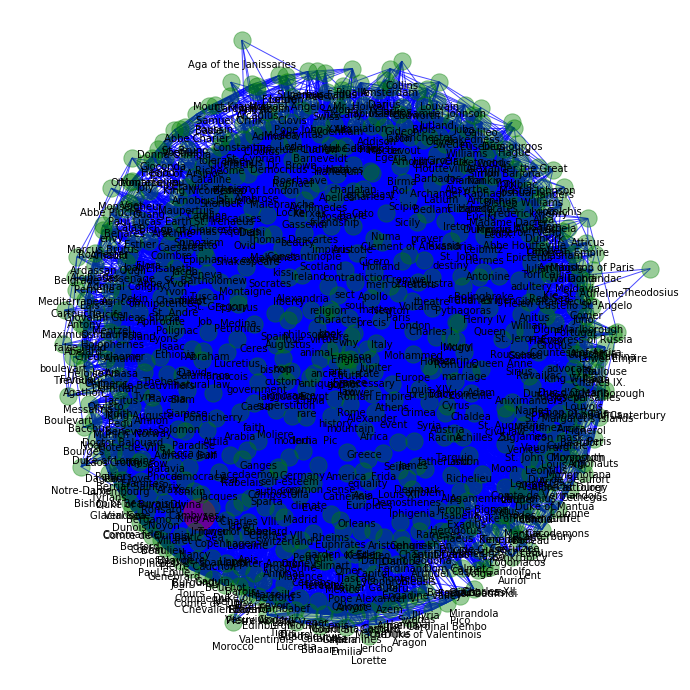

In [54]:
list1=[node0]
list2=[n for n in G.nodes() if n!=node0]
pos=graphviz_layout(G)
plt.figure(figsize=(8,8));
nodes1 = nx.draw_networkx_nodes(G, pos, nodelist=list1,node_size=1000,node_color="r", alpha=0.4)
nodes2 = nx.draw_networkx_nodes(G, pos, nodelist=list2,node_color="g", alpha=0.4)
nx.draw_networkx_edges(G, pos,arrowsize=20, edge_color="b", alpha=0.7)
# nx.draw_networkx_labels(G, pos)
plt.axis('off');
plt.axis('off');
yoffset = {}
y_off = -10  # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(G, yoffset,font_size=10);
plt.tight_layout(-5)

In [55]:
for node1 in G.nodes():
    if node1!=node0:
        try:
            ii = nx.dijkstra_path(G,node0,node1)
            nnd=[(ii[i],ii[i+1]) for i in range(len(ii)-1)]
        except NetworkXNoPath,e:
            ii=[]
            nnd=[]
        if not len(ii) ==0:
            print "The path from '%s' to '%s' is:" %(node0,node1)
            print ii
            print "The distance between '%s' and '%s' in %i" %(node0,node1,len(ii)-1)
            print

The path from 'Baltic Sea' to 'Azem' is:
['Baltic Sea', 'France', 'Azem']
The distance between 'Baltic Sea' and 'Azem' in 2

The path from 'Baltic Sea' to 'Ireton' is:
['Baltic Sea', 'France', 'Ireton']
The distance between 'Baltic Sea' and 'Ireton' in 2

The path from 'Baltic Sea' to 'Medea' is:
['Baltic Sea', 'art', 'Medea']
The distance between 'Baltic Sea' and 'Medea' in 2

The path from 'Baltic Sea' to 'Caesar' is:
['Baltic Sea', 'Italy', 'Caesar']
The distance between 'Baltic Sea' and 'Caesar' in 2

The path from 'Baltic Sea' to 'Egeria' is:
['Baltic Sea', 'Italy', 'Egeria']
The distance between 'Baltic Sea' and 'Egeria' in 2

The path from 'Baltic Sea' to 'Moses' is:
['Baltic Sea', 'France', 'Moses']
The distance between 'Baltic Sea' and 'Moses' in 2

The path from 'Baltic Sea' to 'Cobonas' is:
['Baltic Sea', 'Asia', 'Cobonas']
The distance between 'Baltic Sea' and 'Cobonas' in 2

The path from 'Baltic Sea' to 'garden of Eden' is:
['Baltic Sea', 'India', 'garden of Eden']
The di

The path from 'Baltic Sea' to 'Absyrthe' is:
['Baltic Sea', 'art', 'Absyrthe']
The distance between 'Baltic Sea' and 'Absyrthe' in 2

The path from 'Baltic Sea' to 'superstition' is:
['Baltic Sea', 'Italy', 'superstition']
The distance between 'Baltic Sea' and 'superstition' in 2

The path from 'Baltic Sea' to 'Alexander the Great' is:
['Baltic Sea', 'art', 'Alexander the Great']
The distance between 'Baltic Sea' and 'Alexander the Great' in 2

The path from 'Baltic Sea' to 'Mount Krapack' is:
['Baltic Sea', 'India', 'Mount Krapack']
The distance between 'Baltic Sea' and 'Mount Krapack' in 2

The path from 'Baltic Sea' to 'Utrecht' is:
['Baltic Sea', 'state', 'Utrecht']
The distance between 'Baltic Sea' and 'Utrecht' in 2

The path from 'Baltic Sea' to 'Duc de Richelieu' is:
['Baltic Sea', 'France', 'Duc de Richelieu']
The distance between 'Baltic Sea' and 'Duc de Richelieu' in 2

The path from 'Baltic Sea' to 'Nankin' is:
['Baltic Sea', 'India', 'Nankin']
The distance between 'Baltic 

The path from 'Baltic Sea' to 'Petronius' is:
['Baltic Sea', 'Italy', 'Petronius']
The distance between 'Baltic Sea' and 'Petronius' in 2

The path from 'Baltic Sea' to 'Austria' is:
['Baltic Sea', 'India', 'Austria']
The distance between 'Baltic Sea' and 'Austria' in 2

The path from 'Baltic Sea' to 'Holophernes' is:
['Baltic Sea', 'Italy', 'Holophernes']
The distance between 'Baltic Sea' and 'Holophernes' in 2

The path from 'Baltic Sea' to 'natural law' is:
['Baltic Sea', 'India', 'natural law']
The distance between 'Baltic Sea' and 'natural law' in 2

The path from 'Baltic Sea' to 'animal' is:
['Baltic Sea', 'Italy', 'animal']
The distance between 'Baltic Sea' and 'animal' in 2

The path from 'Baltic Sea' to 'Tuscan' is:
['Baltic Sea', 'India', 'Tuscan']
The distance between 'Baltic Sea' and 'Tuscan' in 2

The path from 'Baltic Sea' to 'Ebro' is:
['Baltic Sea', 'India', 'Ebro']
The distance between 'Baltic Sea' and 'Ebro' in 2

The path from 'Baltic Sea' to 'Paul Jove' is:
['Baltic

The path from 'Baltic Sea' to 'Hobbes' is:
['Baltic Sea', 'France', 'Hobbes']
The distance between 'Baltic Sea' and 'Hobbes' in 2

The path from 'Baltic Sea' to 'truth' is:
['Baltic Sea', 'truth']
The distance between 'Baltic Sea' and 'truth' in 1

The path from 'Baltic Sea' to 'friendship' is:
['Baltic Sea', 'France', 'friendship']
The distance between 'Baltic Sea' and 'friendship' in 2

The path from 'Baltic Sea' to 'Henry IV' is:
['Baltic Sea', 'Italy', 'Henry IV']
The distance between 'Baltic Sea' and 'Henry IV' in 2

The path from 'Baltic Sea' to 'St. Margaret's Islands' is:
['Baltic Sea', 'France', "St. Margaret's Islands"]
The distance between 'Baltic Sea' and 'St. Margaret's Islands' in 2

The path from 'Baltic Sea' to 'Lemoine' is:
['Baltic Sea', 'art', 'Lemoine']
The distance between 'Baltic Sea' and 'Lemoine' in 2

The path from 'Baltic Sea' to 'Aphrodite' is:
['Baltic Sea', 'France', 'Aphrodite']
The distance between 'Baltic Sea' and 'Aphrodite' in 2

The path from 'Baltic 

The path from 'Baltic Sea' to 'Boileau' is:
['Baltic Sea', 'art', 'Boileau']
The distance between 'Baltic Sea' and 'Boileau' in 2

The path from 'Baltic Sea' to 'Apennines' is:
['Baltic Sea', 'India', 'Apennines']
The distance between 'Baltic Sea' and 'Apennines' in 2

The path from 'Baltic Sea' to 'Saint-Denis' is:
['Baltic Sea', 'India', 'Saint-Denis']
The distance between 'Baltic Sea' and 'Saint-Denis' in 2

The path from 'Baltic Sea' to 'Dwina' is:
['Baltic Sea', 'India', 'Dwina']
The distance between 'Baltic Sea' and 'Dwina' in 2

The path from 'Baltic Sea' to 'Rochester' is:
['Baltic Sea', 'art', 'Rochester']
The distance between 'Baltic Sea' and 'Rochester' in 2

The path from 'Baltic Sea' to 'Latium' is:
['Baltic Sea', 'art', 'Latium']
The distance between 'Baltic Sea' and 'Latium' in 2

The path from 'Baltic Sea' to 'Sirius' is:
['Baltic Sea', 'India', 'Sirius']
The distance between 'Baltic Sea' and 'Sirius' in 2

The path from 'Baltic Sea' to 'ancient' is:
['Baltic Sea', 'Ita

The path from 'Baltic Sea' to 'Ludlow' is:
['Baltic Sea', 'art', 'Ludlow']
The distance between 'Baltic Sea' and 'Ludlow' in 2

The path from 'Baltic Sea' to 'Leda' is:
['Baltic Sea', 'art', 'Leda']
The distance between 'Baltic Sea' and 'Leda' in 2

The path from 'Baltic Sea' to 'Lucretia' is:
['Baltic Sea', 'art', 'Lucretia']
The distance between 'Baltic Sea' and 'Lucretia' in 2

The path from 'Baltic Sea' to 'Constantine' is:
['Baltic Sea', 'art', 'Constantine']
The distance between 'Baltic Sea' and 'Constantine' in 2

The path from 'Baltic Sea' to 'Volga' is:
['Baltic Sea', 'France', 'Volga']
The distance between 'Baltic Sea' and 'Volga' in 2

The path from 'Baltic Sea' to 'Abraham' is:
['Baltic Sea', 'India', 'Abraham']
The distance between 'Baltic Sea' and 'Abraham' in 2

The path from 'Baltic Sea' to 'why' is:
['Baltic Sea', 'Pondicherry', 'why']
The distance between 'Baltic Sea' and 'why' in 2

The path from 'Baltic Sea' to 'Comte de Dunois' is:
['Baltic Sea', 'France', 'Comte d

The path from 'Baltic Sea' to 'St. Bruno' is:
['Baltic Sea', 'art', 'St. Bruno']
The distance between 'Baltic Sea' and 'St. Bruno' in 2

The path from 'Baltic Sea' to 'Malebranche' is:
['Baltic Sea', 'France', 'Malebranche']
The distance between 'Baltic Sea' and 'Malebranche' in 2

The path from 'Baltic Sea' to 'Manchester' is:
['Baltic Sea', 'France', 'Manchester']
The distance between 'Baltic Sea' and 'Manchester' in 2

The path from 'Baltic Sea' to 'Houttevillus' is:
['Baltic Sea', 'France', 'Houttevillus']
The distance between 'Baltic Sea' and 'Houttevillus' in 2

The path from 'Baltic Sea' to 'Arnauld' is:
['Baltic Sea', 'art', 'Arnauld']
The distance between 'Baltic Sea' and 'Arnauld' in 2

The path from 'Baltic Sea' to 'King Nicomedes' is:
['Baltic Sea', 'art', 'King Nicomedes']
The distance between 'Baltic Sea' and 'King Nicomedes' in 2

The path from 'Baltic Sea' to 'Adimo' is:
['Baltic Sea', 'India', 'Adimo']
The distance between 'Baltic Sea' and 'Adimo' in 2

The path from '

The path from 'Baltic Sea' to 'Camillus' is:
['Baltic Sea', 'India', 'Camillus']
The distance between 'Baltic Sea' and 'Camillus' in 2

The path from 'Baltic Sea' to 'Gassendi' is:
['Baltic Sea', 'France', 'Gassendi']
The distance between 'Baltic Sea' and 'Gassendi' in 2

The path from 'Baltic Sea' to 'Clodovic' is:
['Baltic Sea', 'India', 'Clodovic']
The distance between 'Baltic Sea' and 'Clodovic' in 2

The path from 'Baltic Sea' to 'Vaugirard' is:
['Baltic Sea', 'France', 'Vaugirard']
The distance between 'Baltic Sea' and 'Vaugirard' in 2

The path from 'Baltic Sea' to 'Frida' is:
['Baltic Sea', 'India', 'Frida']
The distance between 'Baltic Sea' and 'Frida' in 2

The path from 'Baltic Sea' to 'Castille' is:
['Baltic Sea', 'India', 'Castille']
The distance between 'Baltic Sea' and 'Castille' in 2

The path from 'Baltic Sea' to 'Antoninus' is:
['Baltic Sea', 'France', 'Antoninus']
The distance between 'Baltic Sea' and 'Antoninus' in 2

The path from 'Baltic Sea' to 'Atticus' is:
['Ba

The path from 'Baltic Sea' to 'Duke of Lorraine' is:
['Baltic Sea', 'France', 'Duke of Lorraine']
The distance between 'Baltic Sea' and 'Duke of Lorraine' in 2

The path from 'Baltic Sea' to 'Ottoman Empire' is:
['Baltic Sea', 'art', 'Ottoman Empire']
The distance between 'Baltic Sea' and 'Ottoman Empire' in 2

The path from 'Baltic Sea' to 'Countess of Arcira' is:
['Baltic Sea', 'France', 'Countess of Arcira']
The distance between 'Baltic Sea' and 'Countess of Arcira' in 2

The path from 'Baltic Sea' to 'Raphael' is:
['Baltic Sea', 'Italy', 'Raphael']
The distance between 'Baltic Sea' and 'Raphael' in 2

The path from 'Baltic Sea' to 'Nancy' is:
['Baltic Sea', 'art', 'Nancy']
The distance between 'Baltic Sea' and 'Nancy' in 2

The path from 'Baltic Sea' to 'Codrus' is:
['Baltic Sea', 'art', 'Codrus']
The distance between 'Baltic Sea' and 'Codrus' in 2

The path from 'Baltic Sea' to 'Antony' is:
['Baltic Sea', 'art', 'Antony']
The distance between 'Baltic Sea' and 'Antony' in 2

The pa

The path from 'Baltic Sea' to 'Gibraltar' is:
['Baltic Sea', 'India', 'Gibraltar']
The distance between 'Baltic Sea' and 'Gibraltar' in 2

The path from 'Baltic Sea' to 'Selim' is:
['Baltic Sea', 'India', 'Selim']
The distance between 'Baltic Sea' and 'Selim' in 2

The path from 'Baltic Sea' to 'Arachne' is:
['Baltic Sea', 'art', 'Arachne']
The distance between 'Baltic Sea' and 'Arachne' in 2

The path from 'Baltic Sea' to 'Ireland' is:
['Baltic Sea', 'India', 'Ireland']
The distance between 'Baltic Sea' and 'Ireland' in 2

The path from 'Baltic Sea' to 'Clement of Alexandria' is:
['Baltic Sea', 'India', 'Clement of Alexandria']
The distance between 'Baltic Sea' and 'Clement of Alexandria' in 2

The path from 'Baltic Sea' to 'authority' is:
['Baltic Sea', 'Italy', 'authority']
The distance between 'Baltic Sea' and 'authority' in 2

The path from 'Baltic Sea' to 'Emperor Yventi' is:
['Baltic Sea', 'India', 'Emperor Yventi']
The distance between 'Baltic Sea' and 'Emperor Yventi' in 2

Th

The path from 'Baltic Sea' to 'bankruptcy' is:
['Baltic Sea', 'Italy', 'bankruptcy']
The distance between 'Baltic Sea' and 'bankruptcy' in 2

The path from 'Baltic Sea' to 'Sixtus' is:
['Baltic Sea', 'Italy', 'Sixtus']
The distance between 'Baltic Sea' and 'Sixtus' in 2

The path from 'Baltic Sea' to 'custom' is:
['Baltic Sea', 'Italy', 'custom']
The distance between 'Baltic Sea' and 'custom' in 2

The path from 'Baltic Sea' to 'Mantua' is:
['Baltic Sea', 'France', 'Mantua']
The distance between 'Baltic Sea' and 'Mantua' in 2

The path from 'Baltic Sea' to 'Tower of Babel' is:
['Baltic Sea', 'art', 'Tower of Babel']
The distance between 'Baltic Sea' and 'Tower of Babel' in 2

The path from 'Baltic Sea' to 'Donna Olimpia' is:
['Baltic Sea', 'Italy', 'Donna Olimpia']
The distance between 'Baltic Sea' and 'Donna Olimpia' in 2

The path from 'Baltic Sea' to 'Perrault' is:
['Baltic Sea', 'Italy', 'Perrault']
The distance between 'Baltic Sea' and 'Perrault' in 2

The path from 'Baltic Sea' t

The path from 'Baltic Sea' to 'Chu ' is:
['Baltic Sea', 'France', 'Chu ']
The distance between 'Baltic Sea' and 'Chu ' in 2

The path from 'Baltic Sea' to 'Morocco' is:
['Baltic Sea', 'rare', 'Morocco']
The distance between 'Baltic Sea' and 'Morocco' in 2

The path from 'Baltic Sea' to 'Alba' is:
['Baltic Sea', 'art', 'Alba']
The distance between 'Baltic Sea' and 'Alba' in 2

The path from 'Baltic Sea' to 'Spinoza' is:
['Baltic Sea', 'France', 'Spinoza']
The distance between 'Baltic Sea' and 'Spinoza' in 2

The path from 'Baltic Sea' to 'Torricelli' is:
['Baltic Sea', 'France', 'Torricelli']
The distance between 'Baltic Sea' and 'Torricelli' in 2

The path from 'Baltic Sea' to 'atheism' is:
['Baltic Sea', 'art', 'atheism']
The distance between 'Baltic Sea' and 'atheism' in 2

The path from 'Baltic Sea' to 'Bishop of Noyon' is:
['Baltic Sea', 'France', 'Bishop of Noyon']
The distance between 'Baltic Sea' and 'Bishop of Noyon' in 2

The path from 'Baltic Sea' to 'Clodius' is:
['Baltic Se

In [34]:
## 2. Co-Occurrences of Dictionary Terms, Names of Persons and Names of Locations in Dictionary Sentences

In [35]:
# blob = TextBlob(text)
# textSentences = blob.sentences
# sendic=dict()
# for i,v in enumerate(textSentences):
#     sent=v.sentiment.polarity
#     wl=[]
#     for term in allnames:
#         if term in v: 
#             wl.append(term)
#     if len(wl)>1:
#         sendic[i]=wl 
# sendic

In [36]:
# medgess=[]
# for k,v in sendic.items():
#     sent=textSentences[k].sentiment.polarity
#     dd={}
#     ps=set()
#     for j in it.combinations(v, 2):
#         ps.add(j)
#         dd[j]=(k,sent)
#     for jj in ps:
#         s=0
#         ss=0
#         for kk,vv in dd.items():
#             if kk==jj:
#                 s+=1
#                 ss+=vv[1]
#         medgess.append((jj[0],jj[1],"Sentence_"+str(k),ss/float(s)))
# print len(medgess) 
# S=len(medgess)
# # medges

In [37]:
# medgessd=[]
# for e in medgess:
#     d={}
#     d['Sentence']=e[2]
#     d['Average sentiment']=e[3]
#     medgessd.append((e[0],e[1],d))
# # for e in medgessd:
# #     print e

In [38]:
# Gs = nx.MultiGraph()
# Gs.add_edges_from(medgessd)
# for e in Gs.edges(data=True):
#     if e[0]==e[1]:
#         Gs.remove_edge(e[0],e[1])
# print "Nodes =",len(Gs.nodes())
# print "Multiedges =",len(Gs.edges())
# # for e in Gs.edges(data=True):
# #     print e

In [39]:
# weight={(x,y):v['Average sentiment'] for x,y,v in Gs.edges(data=True)}
# w_edges=[(x,y,z) for (x,y),z in weight.items()]
# Gsw = nx.Graph()
# Gsw.add_weighted_edges_from(w_edges)
# N=len(Gsw.nodes())

In [40]:
# print "Graph Gsw is a weighted graph with %i nodes and %i edges" %(len(Gsw.nodes()),len(Gsw.edges()))
# nodetermss=[n for n in Gsw.nodes() if n in nterms]
# nodenamess=[n for n in Gsw.nodes() if n in pnames]
# nodelocss=[n for n in Gsw.nodes() if n in lnames]
# print "The nodes of Gsw are:"
# print len(nodetermss),"terms"
# print len(nodenamess),"names"
# print len(nodelocss),"locations"

# print "The density of Gsw is %.3f" %nx.density(Gsw)
# if nx.is_connected(Gsw)==True:
#     print "Gsw is a connected graph"
# else:
#     print "Gsw is a disconnected graph and it has",nx.number_connected_components(Gsw),"connected components"    
# giant = max(nx.connected_component_subgraphs(Gsw), key=len)
# Gwlccs=Gsw.subgraph(giant)
# print "The largest connected component of Gsw is a weighted graph with %i nodes and %i edges" %(len(Gwlccs.nodes()),len(Gwlccs.edges()))
# print "The density of the largest connected component of Gsw is %.3f" %nx.density(Gwlccs)

# lccmedges=[]
# for e in medgess:
#     if e[0] in giant and e[1] in giant:
#         lccmedges.append((e[0],e[1]))
# NN=len(Gwlccs.nodes())
# SS=len(lccmedges)

In [41]:
# x = dict(nx.degree(Gsw))
# sorted_x = sorted(x.items(), key = lambda kv: kv[1], reverse=True)
# # ftop_nodes= []
# # threshold = 100 # Threshold for ftop_nodes degree > 700
# for k,v in sorted_x:
#     print k,v
# #     if v>threshold:
# #         ftop_nodes.append(k)

In [42]:
# x = dict(nx.degree(Gsw))
# sorted_x = sorted(x.items(), key = lambda kv: kv[1], reverse=True)
# # ftop_nodes= []
# # threshold = 100 # Threshold for ftop_nodes degree > 700
# for k,v in sorted_x:
#     print k,v
# #     if v>threshold:
# #         ftop_nodes.append(k)

In [43]:
# edge_width=[Gsw[u][v]['weight'] for u,v in Gsw.edges()]
# # elabels = nx.get_edge_attributes(Gsw,'weight')
# edge_width1=[10*(0.1+w) for w in edge_width] 
# # print edge_width

# # nodetermss=[n for n in Gsw.nodes() if n in nterms]
# # nodenamess=[n for n in Gsw.nodes() if n in pnames]
# # nodelocss=[n for n in Gsw.nodes() if n in lnames]

# figsize=(20,20)

# cmap=plt.cm.cool
# weight_list = [ e[2]['weight'] for e in Gsw.edges(data=True) ]
# edge_color=weight_list
# vmin = min(edge_color) 
# vmax = max(edge_color) 
# # width_list=[2*math.log(2+w) for w in weight_list]
# width_list=[1.5*math.log(abs(min(weight_list))+2+w) for w in weight_list] #weight_list

# pos=graphviz_layout(Gsw) 
# # print pos['philosophy']
# pos['ancient']=(340, 580)#(403.29, 419.68)
# pos['god']=(220, 420)#(369.3, 438.63)
# pos['art']=(640, 380) #(455.08, 314.31)
# pos['Rome']=(200, 370) #(374.62, 360.95)
# pos['nature']=(400, 160)#(407.21, 373.0)
# pos['book']=(220, 290)#(402.87, 367.09)
# pos['religion']=(230, 470)#(403.29, 419.68)
# pos['love']=(270, 530)#(403.29, 419.68)
# pos['law']=(470, 590)#(403.29, 419.68)
# pos['France']=(590, 520)#(403.29, 419.68)
# pos['philosopher']=(270, 210)#(403.29, 419.68)
# pos['reason']=(500, 160)#(403.29, 419.68)
# pos['author']=(580, 210)#(403.29, 419.68)
# pos['state']=(640, 270)#(403.29, 419.68)

# node_color="#ffb3b3"
# node_border_color="grey"
# # edge_color="#668cff"

# # d = Gw.degree()
# # node_size=[7*v[1] for v in list(nx.degree(G))]
# nsi1=[5*Gsw.degree(n) for n in Gsw.nodes() if n in nodetermss]
# nsi2=[3*Gsw.degree(n) for n in Gsw.nodes() if n in nodenamess]
# nsi3=[5*Gsw.degree(n) for n in Gsw.nodes() if n in nodelocss]

# plt.figure(figsize=figsize);
# # nodes = nx.draw_networkx_nodes(Gw, pos,node_color=node_color,node_size=node_size)

# nodes1 = nx.draw_networkx_nodes(Gsw, pos,nodelist=nodetermss, node_color="lime",node_size=nsi1)
# nodes2 = nx.draw_networkx_nodes(Gsw, pos,nodelist=nodenamess, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
# nodes3 = nx.draw_networkx_nodes(Gsw, pos,nodelist=nodelocss, node_shape="s",node_color="gold",node_size=nsi3)

# # nodes.set_edgecolor(node_border_color)
# # nx.draw_networkx_edges(G, pos, edge_color=edge_color,width=edge_width,a=1)
# nx.draw_networkx_edges(Gsw, pos,width=width_list,edge_color=edge_color,edge_cmap=cmap,vmin=vmin, vmax=vmax,alpha=0.3)
# labels_no={}
# for n in Gsw.nodes():
#     if Gsw.degree(n)>49:
#         labels_no[n]=str(n)
#     else:
#         labels_no[n]=''
# # nx.draw_networkx_labels(Gw, pos,labels=labels_no)
# # nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
# plt.axis('off');
# yoffset = {}
# y_off = -12   # offset on the y axis
# for k, v in pos.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gsw, yoffset,labels=labels_no,font_size=12);
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
# sm.set_array([])
# cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.7, pad = 0.02)
# cbar.set_label('Average sentiment of sentences')
# sst="The graph of co-occurring %i dictionary terms \n in %i %s sentences \n weighted over their average sentiment score \n (lime circles are terms, pink stars are names and gold squares are locations)" %(N,S,titlename)
# # sst="The graph of co-occurring dictionary terms \n in sentences of the Voltaire Dictionary items" 
# plt.title(sst,fontsize=25);
# plt.margins(x=0.1, y=0.05) 

In [44]:
# # Cell A
# pos0=nx.circular_layout(nx.cycle_graph(3)) 

# G1=Gsw.subgraph(nodetermss)
# sh1=[]
# sh2=[]
# sh3=[]
# for i,n in enumerate(G1.nodes()):
#     if i in range(15):
#         sh1.append(n)
#     elif i in range(15,47):
#         sh2.append(n)
#     else:
#         sh3.append(n)
# shells1=[sh1,sh2,sh3]
# pos1=nx.shell_layout(G1, shells1) 

# G2=Gsw.subgraph(nodenamess)
# sh11=[]
# sh22=[]
# sh33=[]
# sh44=[]
# sh55=[]
# sh66=[]
# for i,n in enumerate(G2.nodes()):
#     if i in range(15):
#         sh11.append(n)
#     elif i in range(15,45):
#         sh22.append(n)
#     elif i in range(45,90):
#         sh33.append(n)
#     elif i in range(90,160):
#         sh44.append(n)
#     elif i in range(160,240):
#         sh55.append(n)
#     else:
#         sh66.append(n)
# shells2=[sh11,sh22,sh33,sh44,sh55,sh66]
# pos2=nx.shell_layout(G2, shells2) 

# G3=Gsw.subgraph(nodelocss)
# sh111=[]
# sh222=[]
# sh333=[]
# sh444=[]
# sh555=[]
# sh666=[]
# for i,n in enumerate(G3.nodes()):
#     if i in range(12):
#         sh111.append(n)
#     elif i in range(12,30):
#         sh222.append(n)
#     elif i in range(30,65):
#         sh333.append(n)
#     elif i in range(65,110):
#         sh444.append(n)
#     elif i in range(110,160):
#         sh555.append(n)
#     else:
#         sh666.append(n)
# shells3=[sh111,sh222,sh333,sh444,sh555,sh666]
# pos3=nx.shell_layout(G3, shells3) 
        
# def re_pos(pos,centre,radius):
#     plist=[list(v) for v in pos.values()]
#     nplist=[v for v in pos.values()]
#     x = [p[0] for p in plist]
#     y = [p[1] for p in plist]
#     centroid = (sum(x) / float(len(plist)), sum(y) / float(len(plist)))
#     ncentroid=np.array(centroid)
#     rad=max([np.linalg.norm(nplist[i]-ncentroid) for i in range(len(nplist))])
#     rpos={}
#     for k,v in pos.items():
#         rpos[k]=[(v[0]+centre[0])/float(radius),(v[1]+centre[1])/float(radius)]
#     return rpos

# centers=pos0.values()
# centerm=[]
# for i in range(len(centers)):
#     t=[]
#     for j in centers[i]:
#         t.append(1.35*j)  #3* 2.7*
#     centerm.append(np.array(t))
# centers=centerm

# # radius=1. #1.5
# pos1=re_pos(pos1,centers[0],0.008) #radius)  
# pos2=re_pos(pos2,centers[1],0.004) #radius)    
# pos3=re_pos(pos3,centers[2],0.004) #radius) 


# pos3['Manchester']=[-174.35807203873966, -162]#[-174.35807203873966, -167.40944750392023]
# pos3['Constantinople']=[-168.74998406277223, -37]#[-168.74998406277223, -42.28358484589639]
# pos3['Danube']=[-162.93342206627105, -463]#[-162.93342206627105, -458.8487348684031]

# pos1['destiny']=[168.7499974904832, 93]#[168.7499974904832, 83.3333391696215]
# pos1['men of letters']=[185.00753194093704, 87]#[185.00753194093704, 81.7321125417948]
# pos1['ignorance']=[168.75000212683892, -89]#[168.75000212683892, -83.33333246409889]
# pos1['natural law']=[168.7500011801692, -133]#[168.7500011801692, -124.99999664723869]
# pos1['boulevart']=[152.4342231452465, 129]#[152.4342231452465, 123.93061406910422]
# pos1['equality']=[164.39465088769794, -46]#[164.39465088769794, -41.438412293791735]
# pos1['iron mask']=[185.0657805800438, 132]#[185.0657805800438, 123.93060661852363]
# pos1['author']=[152.43420079350471, -128]#[152.43420079350471, -123.93059991300102]

# pos2['Lais']=[-173.10538124293112, 338]#[-173.10538124293112, 333.7219937869268]
# pos2['Addison']=[-160.0393241271379, 380]#[-160.0393241271379, 375.16040943347986]
# pos2['Mentzel']=[-164.387587271631, 423]#[-164.387587271631, 417.2074332066732]
# pos2['Ouang']=[-152.40438263863348, 505]#[-152.40438263863348, 499.97468136035974]
# pos2['Judith']=[-131.66319560259603, 459]#[-131.66319560259603, 454.77156184398706]
# pos2['Rousseau']=[-185.0956602022054, 506]#[-185.0956602022054, 499.97468136035974]
# pos2['Boerhaave']=[-184, 464]#[-176.22748697176598, 458.78243289672906]
# pos2['Queen Anne']=[-146.37781102210306, 466]#[-146.37781102210306, 457.44187973224695]
# pos2['Chilperic']=[-173.1053742580118, 245]#[-173.1053742580118, 250.84516249382077]
# pos2['Achilles']=[-177.46072057634615, 203]#[-177.46072057634615, 209.40674684726773]
# pos2['Henry IV']=[-181.8160664290192, 162]#[-181.8160664290192, 167.96833865129528]
# pos2['Archbishop of Canterbury']=[-199.835907481611, 38]#[-199.835907481611, 44.22376893245755]
# pos2['Pierre Cauchon']=[-176.2274976819756, 116]#[-176.2274976819756, 125.78473828517971]
# pos2['Fronde']=[-164.38761055469536, 175]#[-164.38761055469536, 167.35972307407437]
# pos2['Catherine']=[-146.37780357152246, 134]#[-146.37780357152246, 127.12527654850064]
# pos2['St. Gregory']=[-150.06745215505384, 34]#[-150.06745215505384, 42.98263631546079]
# pos2['Hermes']=[-201.34054850786947, 80]#[-201.34054850786947, 86.5151866503912]
# pos2['Julian']=[-194, 122]#[-191.12224485725187, 127.12527654850064]
# pos2['Confutzee']=[-174.98271102085732, 45]#[-174.98271102085732, 42.36128769599973]
# pos2['Aristophanes']=[-168.75002266135968, 76]#[-168.75002266135968, 83.9502497740942]
# pos2['Amasa']=[-136.15949805825971, 78]#[-136.15949805825971, 86.5151866503912]
# pos2['Poussin']=[-120.11555563658499, 85]#[-120.11555563658499, 89.70652363979397]
# pos2['William']=[-213, 462]#[-205.83685096353315, 454.77156184398706]
# pos2['Samuel Ornik']=[-220.25286387652181, 454]#[-220.25286387652181, 450.7929965087133]

# posAll=dict(pos1.items()+pos2.items()+pos3.items()+[(k,pos1[k]+pos2[k]+pos3[k]) for k in set(pos3)&set(pos2)&set(pos1)])

In [45]:
# # Cell B

# plt.figure(figsize=(19,30))
# node_border_color="r"
# edge_color="#668cff"

# nsi1=[0.1*Gsw.degree(n) for n in nodetermss] 
# nsi2=[Gsw.degree(n) for n in nodenamess]
# nsi3=[0.1*Gsw.degree(n) for n in nodelocss]

# nodes1 = nx.draw_networkx_nodes(G1, pos=pos1,nodelist=nodetermss,node_size=nsi1, node_color="lime")
# nodes2 = nx.draw_networkx_nodes(G2, pos=pos2,nodelist=nodenamess,node_size=nsi2, node_shape="*", node_color="#ffb3b3")
# nodes3 = nx.draw_networkx_nodes(G3, pos=pos3,nodelist=nodelocss,node_size=nsi3, node_shape="s",node_color="gold")
# # nx.draw_networkx_nodes(G5,pos=pos5,node_size=nsi5,nodelist=c5,node_color='cyan',alpha=1.);
# # nx.draw_networkx_nodes(G6,pos=pos6,node_size=nsi6,nodelist=c6,node_color='magenta',alpha=1.);

# nx.draw_networkx_edges(Gsw, posAll, edge_color=edge_color,width=edge_width,alpha=0.2)
# # nx.draw_networkx_labels(CGwi,posAll,labels=labels,font_size=13); 

# # nx.draw_networkx_edges(G,pos=pos,edge_color='b',width=edgewidth,alpha=0.2);
# # nx.draw_networkx_labels(G,pos=pos,labels=labels,font_size=25);

# # plt.axis('off');
# # yoffset = {}
# # y_off = -0.16 # offset on the y axis
# # for k, v in posAll.items():
# #     yoffset[k] = (v[0], v[1]+y_off)
# # nx.draw_networkx_labels(Gw, yoffset, font_size=16);
# # sst="The %i communities of the graph of %s" %(kk,name)
# # plt.title(sst,fontsize=20);
# # plt.margins(x=0.3, y=0.1) 


# # nx.draw_networkx_labels(G, pos)
# # nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
# plt.axis('off');
# labels_no={}
# for n in Gsw.nodes():
#     labels_no[n]=str(n) #''
# yoffset = {}
# y_off = -4 # offset on the y axis
# for k, v in posAll.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gsw, yoffset,labels=labels_no,font_size=8);
# sst="The graph of co-occurring %i dictionary terms \n in %i %s sentences \n weighted over their average sentiment score \n (lime circles are terms, pink stars are names and gold squares are locations)" %(N,S,titlename)
# plt.title(sst,fontsize=20);
# plt.margins(x=0.02, y=0.01) 

In [46]:
# Gws=Gwlccs
# nodetermsss=[n for n in Gws.nodes() if n in nterms]
# nodenamesss=[n for n in Gws.nodes() if n in pnames]
# nodelocsss=[n for n in Gws.nodes() if n in lnames]
# print "The nodes of Gws are:"
# print len(nodetermsss),"terms"
# print len(nodenamesss),"names"
# print len(nodelocsss),"locations"

In [47]:
# # Gws=Gwlccs

# edge_width=[Gws[u][v]['weight'] for u,v in Gws.edges()]
# # elabels = nx.get_edge_attributes(Gws,'weight')
# edge_width1=[10*(0.1+w) for w in edge_width] 
# # print edge_width

# # nodetermsss=[n for n in Gws.nodes() if n in nterms]
# # nodenamesss=[n for n in Gws.nodes() if n in pnames]
# # nodelocsss=[n for n in Gws.nodes() if n in lnames]

# figsize=(20,20)

# cmap=plt.cm.cool
# weight_list = [ e[2]['weight'] for e in Gws.edges(data=True) ]
# edge_color=weight_list
# vmin = min(edge_color) 
# vmax = max(edge_color) 
# # width_list=[2*math.log(2+w) for w in weight_list]
# width_list=[1.5*math.log(abs(min(weight_list))+2+w) for w in weight_list] #weight_list

# pos=graphviz_layout(Gws) 

# # print pos['god']
# pos['ancient']=(340, 490)#(403.29, 419.68)
# pos['god']=(200, 310)#(369.3, 438.63)
# pos['art']=(660, 290) #(455.08, 314.31)
# pos['Rome']=(200, 270) #(374.62, 360.95)
# pos['nature']=(400, 70)#(407.21, 373.0)
# pos['book']=(220, 200)#(402.87, 367.09)
# pos['religion']=(230, 390)#(403.29, 419.68)
# pos['love']=(270, 440)#(403.29, 419.68)
# pos['law']=(470, 510)#(403.29, 419.68)
# pos['France']=(600, 430)#(403.29, 419.68)
# pos['philosopher']=(280, 120)#(403.29, 419.68)
# pos['reason']=(500, 70)#(403.29, 419.68)
# pos['author']=(580, 120)#(403.29, 419.68)
# pos['state']=(640, 180)#(403.29, 419.68)
# pos['Africa']=(210, 240)#(369.3, 438.63)
# pos['India']=(235, 180)#(369.3, 438.63)
# pos['Egypt']=(255, 140)#(369.3, 438.63)
# pos['antiquity']=(300, 100)#(369.3, 438.63)
# pos['soul']=(330, 80)#(369.3, 438.63)
# pos['animal']=(360, 70)#(369.3, 438.63)
# pos['language']=(450, 70)#(369.3, 438.63)
# pos['event']=(540, 95)#(369.3, 438.63)
# pos['Chu']=(610, 150)#(369.3, 438.63)
# pos['bishop']=(650, 215)#(369.3, 438.63)
# pos['corn']=(370, 500)#(369.3, 438.63)
# pos['virtue']=(210, 340)#(369.3, 438.63)
# pos['Europe']=(220, 365)#(369.3, 438.63)
# pos['custom']=(240, 415)#(369.3, 438.63)
# pos['necessary']=(305, 465)#(369.3, 438.63)
# pos['master']=(410, 515)#(369.3, 438.63)
# pos['sect']=(440, 510)#(369.3, 438.63)
# pos['truth']=(500, 500)#(369.3, 438.63)
# pos['Paris']=(540, 480)#(369.3, 438.63)
# pos['kiss']=(570, 460)#(369.3, 438.63)
# pos['Eve']=(660, 320)#(369.3, 438.63)
# pos['power']=(625, 385)#(369.3, 438.63)
# pos['England']=(650, 340)#(369.3, 438.63)
# pos['history']=(660, 250)#(369.3, 438.63)

# node_color="#ffb3b3"
# node_border_color="grey"
# # edge_color="#668cff"

# # d = Gw.degree()
# # node_size=[7*v[1] for v in list(nx.degree(G))]
# nsi1=[5*Gws.degree(n) for n in Gws.nodes() if n in nodetermsss]
# nsi2=[3*Gws.degree(n) for n in Gws.nodes() if n in nodenamesss]
# nsi3=[5*Gws.degree(n) for n in Gws.nodes() if n in nodelocsss]

# plt.figure(figsize=figsize);
# # nodes = nx.draw_networkx_nodes(Gw, pos,node_color=node_color,node_size=node_size


# nodes1 = nx.draw_networkx_nodes(Gws, pos,nodelist=nodetermsss, node_color="lime",node_size=nsi1)
# nodes2 = nx.draw_networkx_nodes(Gws, pos,nodelist=nodenamesss, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
# nodes3 = nx.draw_networkx_nodes(Gws, pos,nodelist=nodelocsss, node_shape="s",node_color="gold",node_size=nsi3)

# # nodes.set_edgecolor(node_border_color)
# # nx.draw_networkx_edges(G, pos, edge_color=edge_color,width=edge_width,a=1)
# nx.draw_networkx_edges(Gws, pos,width=width_list,edge_color=edge_color,edge_cmap=cmap,vmin=vmin, vmax=vmax,alpha=0.3)
# labels_no={}
# for n in Gws.nodes():
#     if Gws.degree(n)>30:
#         labels_no[n]=str(n)
#     else:
#         labels_no[n]=''
# # nx.draw_networkx_labels(Gw, pos,labels=labels_no)
# # nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
# plt.axis('off');
# yoffset = {}
# y_off = -7   # offset on the y axis
# for k, v in pos.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gws, yoffset,labels=labels_no,font_size=12);
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
# sm.set_array([])
# cbar = plt.colorbar(sm, orientation='horizontal', shrink=0.7, pad = 0.02)
# cbar.set_label('Average sentiment of sentences')
# # sst="The largest connected component of the graph of co-occurring dictionary terms in sentences of the Voltaire Dictionary items" 
# sst="The largest connected component of the \n graph of co-occurring %i dictionary terms in %i %s sentences \n weighted over their average sentiment score" %(N,S,titlename) 
# plt.title(sst,fontsize=25);
# plt.margins(x=0.1, y=0.05) 

In [48]:
# # Cell A

# pos0=nx.circular_layout(nx.cycle_graph(3)) 

# G1=Gws.subgraph(nodetermsss)
# sh1=[]
# sh2=[]
# sh3=[]
# for i,n in enumerate(G1.nodes()):
#     if i in range(15):
#         sh1.append(n)
#     elif i in range(15,47):
#         sh2.append(n)
#     else:
#         sh3.append(n)
# shells1=[sh1,sh2,sh3]
# pos1=nx.shell_layout(G1, shells1) 

# G2=Gws.subgraph(nodenamesss)
# sh11=[]
# sh22=[]
# sh33=[]
# sh44=[]
# sh55=[]
# sh66=[]
# for i,n in enumerate(G2.nodes()):
#     if i in range(14):
#         sh11.append(n)
#     elif i in range(14,35):
#         sh22.append(n)
#     elif i in range(35,85):
#         sh33.append(n)
#     elif i in range(85,150):
#         sh44.append(n)
#     elif i in range(150,210):
#         sh55.append(n)
#     else:
#         sh66.append(n)
# shells2=[sh11,sh22,sh33,sh44,sh55,sh66]
# pos2=nx.shell_layout(G2, shells2) 

# G3=Gws.subgraph(nodelocsss)
# sh111=[]
# sh222=[]
# sh333=[]
# sh444=[]
# sh555=[]
# sh666=[]
# for i,n in enumerate(G3.nodes()):
#     if i in range(12):
#         sh111.append(n)
#     elif i in range(12,32):
#         sh222.append(n)
#     elif i in range(32,57):
#         sh333.append(n)
#     elif i in range(57,96):
#         sh444.append(n)
#     elif i in range(96,143):
#         sh555.append(n)
#     else:
#         sh666.append(n)
# shells3=[sh111,sh222,sh333,sh444,sh555,sh666]
# pos3=nx.shell_layout(G3, shells3) 
        
# def re_pos(pos,centre,radius):
#     plist=[list(v) for v in pos.values()]
#     nplist=[v for v in pos.values()]
#     x = [p[0] for p in plist]
#     y = [p[1] for p in plist]
#     centroid = (sum(x) / float(len(plist)), sum(y) / float(len(plist)))
#     ncentroid=np.array(centroid)
#     rad=max([np.linalg.norm(nplist[i]-ncentroid) for i in range(len(nplist))])
#     rpos={}
#     for k,v in pos.items():
#         rpos[k]=[(v[0]+centre[0])/float(radius),(v[1]+centre[1])/float(radius)]
#     return rpos

# centers=pos0.values()
# centerm=[]
# for i in range(len(centers)):
#     t=[]
#     for j in centers[i]:
#         t.append(1.35*j)  #3* 2.7*
#     centerm.append(np.array(t))
# centers=centerm

# # radius=1. #1.5
# pos1=re_pos(pos1,centers[0],0.008) #radius)  
# pos2=re_pos(pos2,centers[1],0.004) #radius)    
# pos3=re_pos(pos3,centers[2],0.004) #radius) 

# pos3['Morocco']=[-183.2861358299849, -547]#[-183.2861358299849, -541.8606302865703]
# pos3['Prosperine']=[-175.7113922387359, -507]#[-175.7113922387359, -500.50057984673566]

# pos1['destiny']=[168.7499974904832, 93]#[168.7499974904832, 83.3333391696215]
# pos1['men of letters']=[185.00753194093704, 87]#[185.00753194093704, 81.7321125417948]
# pos1['ignorance']=[152, -87]#[152.49246805906296, -81.7321058362722]
# pos1['natural law']=[168.7500011801692, -133]#[164.5731495693326, -124.93019215762611]
# pos1['boulevart']=[160, 129]#[164.5731276832521, 124.93019886314872]
# pos1['equality']=[161, -46]#[164.39465088769794, -41.438412293791735]
# pos1['iron mask']=[197, 132]#[197.7275226265192, 121.59483470022681]
# pos1['author']=[152.43420079350471, -128]#[147.9588121175766, -123.2587736099958]
# pos1['french']=[168.75000212683892, -92]#[168.75000212683892, -83.33333246409889]
# pos1['character']=[164.39464390277863, 45]#[164.39464390277863, 41.438418999314344]

# pos2['Lais']=[-178.02173253148817, 339]#[-178.02173253148817, 332.9055777915674]
# pos2['Pigalle']=[-176.59883182495855, 424]#[-176.59883182495855, 417.036919219132]
# pos2['Isaac']=[-146.97327073663496, 504]#[-146.97327073663496, 499.4756414719778]
# pos2['Samuel Ornik']=[-180.82248307764553, 474]#[-180.82248307764553, 458.51243875705774]
# pos2['William']=[-164.72273906692885, 465]#[-164.72273906692885, 458.90158258163507]
# pos2['Clodius']=[-163.3710118941965, 546]#[-163.3710118941965, 542.2257020302969]
# pos2['Malebranche']=[-196.80953007191442, 460]#[-196.80953007191442, 456.5712644883352]
# pos2['King Auguste']=[-145.32735552638792, 425]#[-145.32735552638792, 415.0694816538053]
# pos2['Laurette']=[-148.66057578474306, 461]#[-148.66057578474306, 457.7350600787359]
# pos2['Arundel']=[-162.52250112593197, 203]#[-162.52250112593197, 209.1832592316824]
# pos2['Empress of Russia']=[-168.7500203847932, 78]#[-168.7500203847932, 83.9502497740942]
# pos2['Henry IV']=[-192.17269476503157, 163]#[-192.17269476503157, 169.49767462694226]
# pos2['Pierre Cauchon']=[-180.82249425351642, 118]#[-180.82249425351642, 126.05471752368985]
# pos2['Agamemnon']=[-163.37099792435788, 36]#[-163.37099792435788, 42.34145425045072]
# pos2['Adimo']=[-160.90120356529974, 162]#[-160.90120356529974, 167.53023706161557]
# pos2['Pic']=[-145.32734807580732, 164]#[-145.32734807580732, 169.49767462694226]
# pos2['Catherine']=[-140, 120]#[-148.6605664715173, 126.83209620201168]
# pos2['Queen']=[-160, 125.66557369911251]#[-164.7227297537031, 125.66557369911251]
# pos2['Julian']=[-210, 122]#[-196.80954311043047, 127.99589179241238]
# pos2['Chilperic']=[-178.0217353254559, 246]#[-178.0217353254559, 251.66158221447049]
# pos2['Hesiod']=[-141.90468918532156, 40]#[-141.90468918532156, 43.72909508430539]
# pos2['Phocas']=[-141.90467242151522, 542]#[-141.90467242151522, 540.8380462952811]

# posAll=dict(pos1.items()+pos2.items()+pos3.items()+[(k,pos1[k]+pos2[k]+pos3[k]) for k in set(pos3)&set(pos2)&set(pos1)])

In [49]:
# # Cell B

# plt.figure(figsize=(19,30))
# node_border_color="r"
# edge_color="#668cff"

# nsi1=[0.1*Gws.degree(n) for n in nodetermsss] 
# nsi2=[Gws.degree(n) for n in nodenamesss]
# nsi3=[0.1*Gws.degree(n) for n in nodelocsss]

# nodes1 = nx.draw_networkx_nodes(G1, pos=pos1,nodelist=nodetermsss,node_size=nsi1, node_color="lime")
# nodes2 = nx.draw_networkx_nodes(G2, pos=pos2,nodelist=nodenamesss,node_size=nsi2, node_shape="*", node_color="#ffb3b3")
# nodes3 = nx.draw_networkx_nodes(G3, pos=pos3,nodelist=nodelocsss,node_size=nsi3, node_shape="s",node_color="gold")
# # nx.draw_networkx_nodes(G5,pos=pos5,node_size=nsi5,nodelist=c5,node_color='cyan',alpha=1.);
# # nx.draw_networkx_nodes(G6,pos=pos6,node_size=nsi6,nodelist=c6,node_color='magenta',alpha=1.);

# nx.draw_networkx_edges(Gws, posAll, edge_color=edge_color,width=edge_width,alpha=0.2)
# # nx.draw_networkx_labels(CGwi,posAll,labels=labels,font_size=13); 

# # nx.draw_networkx_edges(G,pos=pos,edge_color='b',width=edgewidth,alpha=0.2);
# # nx.draw_networkx_labels(G,pos=pos,labels=labels,font_size=25);

# # plt.axis('off');
# # yoffset = {}
# # y_off = -0.16 # offset on the y axis
# # for k, v in posAll.items():
# #     yoffset[k] = (v[0], v[1]+y_off)
# # nx.draw_networkx_labels(Gw, yoffset, font_size=16);
# # sst="The %i communities of the graph of %s" %(kk,name)
# # plt.title(sst,fontsize=20);
# # plt.margins(x=0.3, y=0.1) 


# # nx.draw_networkx_labels(G, pos)
# # nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
# plt.axis('off');
# labels_no={}
# for n in Gws.nodes():
#     labels_no[n]=str(n) #''
# yoffset = {}
# y_off = -4 # offset on the y axis
# for k, v in posAll.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gws, yoffset,labels=labels_no,font_size=8);
# sst="The largest connected component of the \n graph of co-occurring %i dictionary terms in %i %s sentences \n weighted over their average sentiment score" %(N,S,titlename) 
# plt.title(sst,fontsize=20);
# plt.margins(x=0.04, y=0.01) 